# **Clustering assignment**

In [114]:
# Load libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the data set
df = pd.read_excel('EastWestAirlines.xlsx', sheet_name='data', index_col='ID#')
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3999 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 374.9 KB


In [4]:
df.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


From the above report we see that there are outliers present in most of the features

In [5]:
# Check missing values
df.isna().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [6]:
# Check duplicated rows

df.duplicated().sum()

1

In [7]:
# Find the duplicate value index

df[df.duplicated(keep=False)]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
3393,1000,0,1,1,1,0,0,0,0,1597,0
3899,1000,0,1,1,1,0,0,0,0,1597,0


In [8]:
# Drop any 1 row, say 3393
df.drop(index=3393,inplace=True)
df.duplicated().sum()

0

# EDA

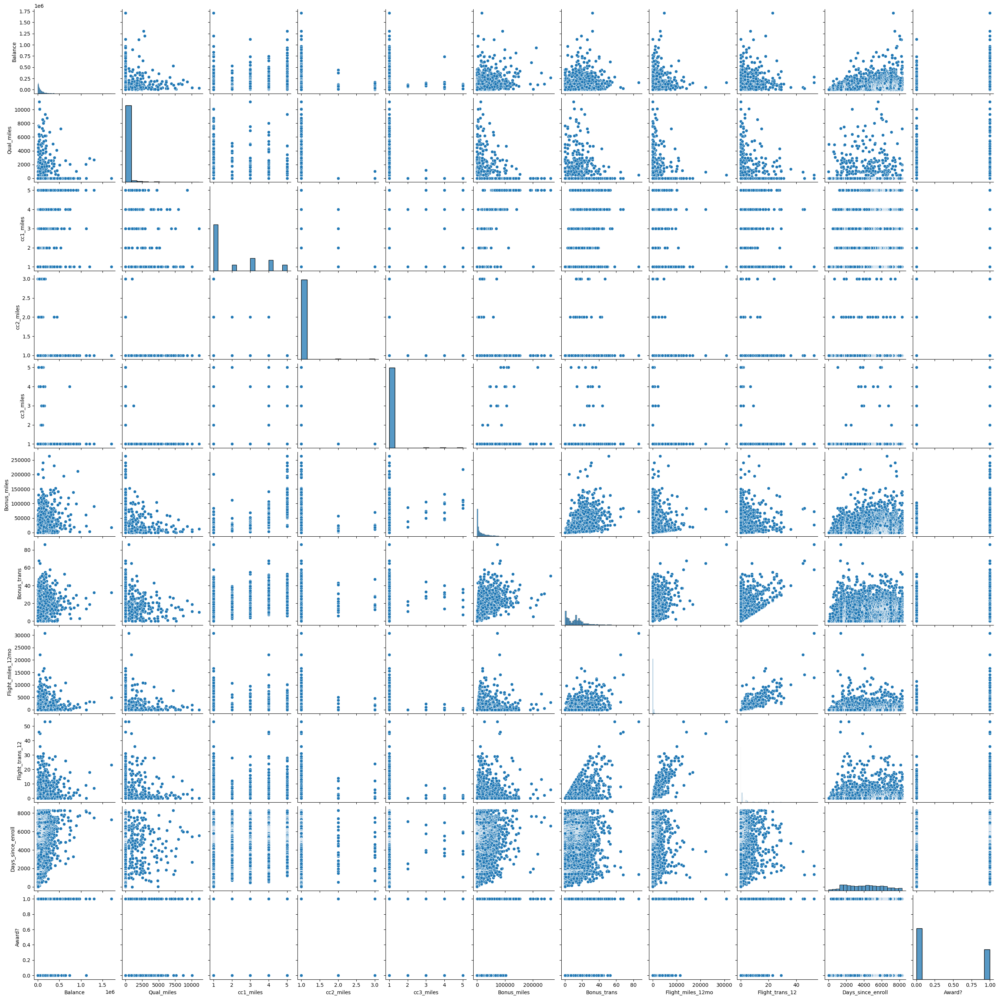

In [9]:
# Create scatter plots

sns.pairplot(df)

# Feature Scaling

In [10]:
from sklearn.preprocessing import StandardScaler

In [11]:
sc = StandardScaler()

x = sc.fit_transform(df)

In [12]:
x

array([[-4.51293870e-01, -1.86322793e-01, -7.69731660e-01, ...,
        -3.62219103e-01,  1.39523468e+00, -7.67071631e-01],
       [-5.39604653e-01, -1.86322793e-01, -7.69731660e-01, ...,
        -3.62219103e-01,  1.37973643e+00, -7.67071631e-01],
       [-3.20192202e-01, -1.86322793e-01, -7.69731660e-01, ...,
        -3.62219103e-01,  1.41170157e+00, -7.67071631e-01],
       ...,
       [-2.23153612e-04, -1.86322793e-01,  6.82893866e-01, ...,
        -3.62219103e-01, -1.31599028e+00,  1.30365921e+00],
       [-1.85776026e-01, -1.86322793e-01, -7.69731660e-01, ...,
        -9.85832074e-02, -1.31647460e+00, -7.67071631e-01],
       [-7.00646048e-01, -1.86322793e-01, -7.69731660e-01, ...,
        -3.62219103e-01, -1.31792757e+00, -7.67071631e-01]])

# Model Building

In [13]:
# Import Heierarchial clustering libraries

from sklearn.cluster import AgglomerativeClustering

# Import Dendrogram library from Scipy

from scipy.cluster import hierarchy

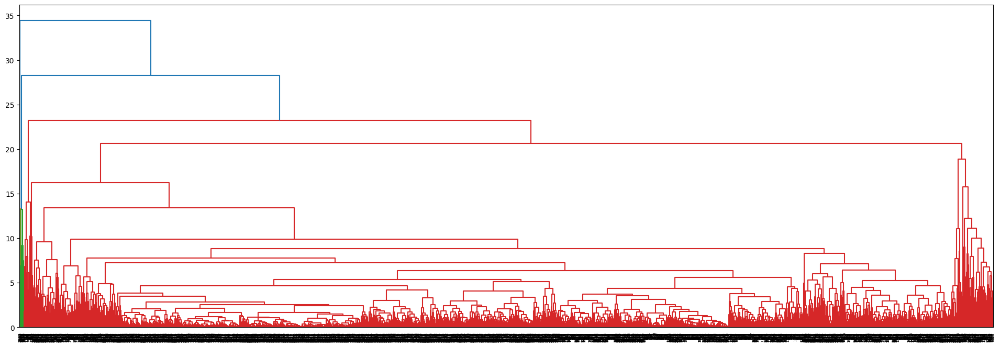

In [14]:
lk = hierarchy.linkage(x, method='complete')
plt.figure(figsize=(24,8))
dendrogram = hierarchy.dendrogram(lk)

We see that the Dendrogram has created 3 clusters

In [15]:
# Create a model

hc = AgglomerativeClustering(n_clusters=3)
ypred = hc.fit_predict(x)

In [16]:
df['cluster'] = ypred
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
ID#,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,0
4018,64385,0,1,1,1,981,5,0,0,1395,1,0
4019,73597,0,3,1,1,25447,8,0,0,1402,1,1


In [17]:
df.groupby('cluster').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
cluster,,,,,,,,,,,
0,46737.239148,9.278135,1.242363,1.023312,1.000000,5039.817524,7.094051,221.256029,0.700563,3773.660370,0.188103
1,116314.450725,363.839130,3.498551,1.000000,1.035507,37150.356522,18.066667,377.000000,1.150000,4696.888406,0.663043
2,134880.892308,393.323077,2.430769,1.000000,1.000000,36582.169231,29.338462,5915.523077,16.638462,4599.607692,0.753846


From the report above we can say that the model has created clusters majorly based on miles qualifying for Topflight status, Bonus transaction miles, Bonus transactions, Flight miles in past 12 months, along with the averages of other features.

# Visualize Clusters

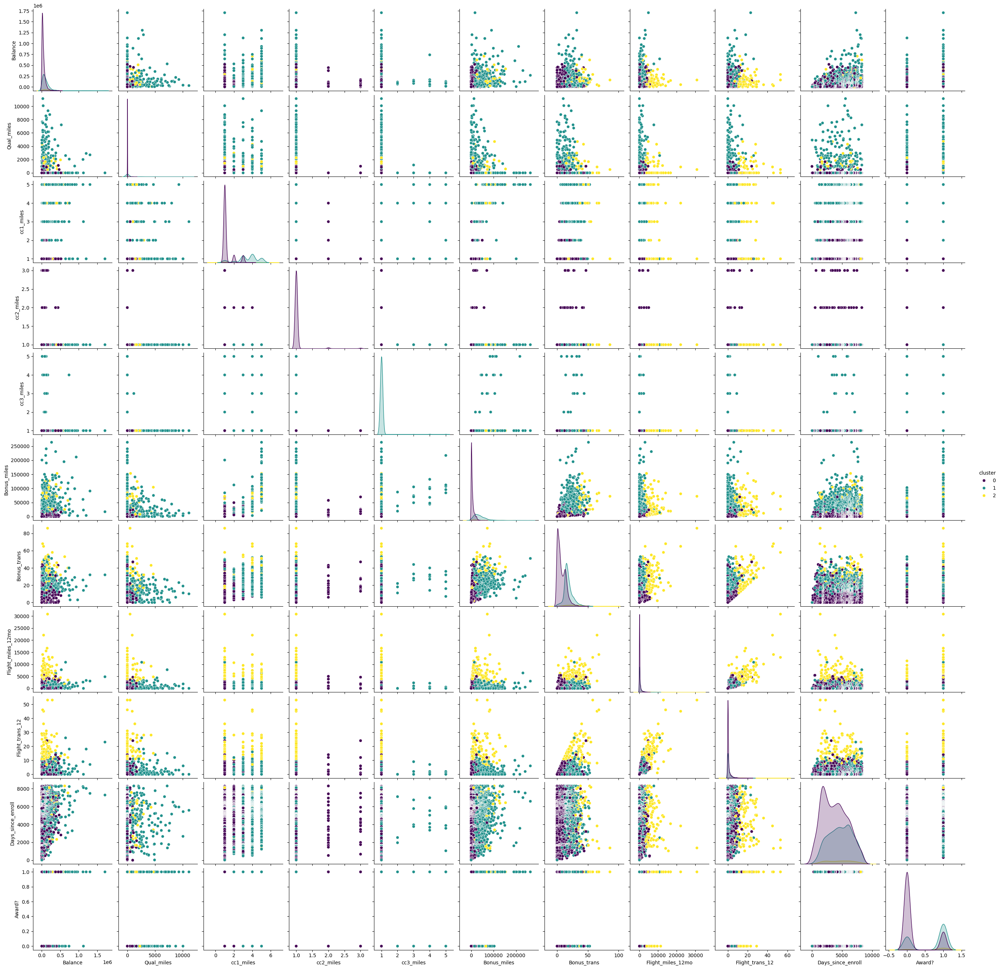

In [24]:
sns.pairplot(df, hue='cluster', palette='viridis')

In [20]:
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
ID#,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


<Axes: xlabel='Balance', ylabel='Bonus_miles'>

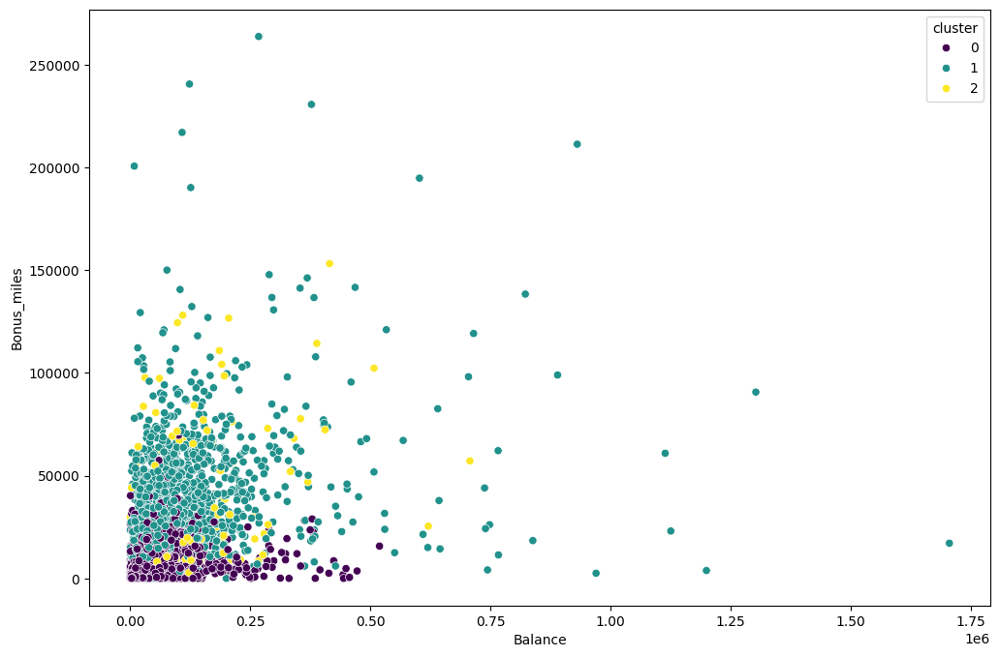

In [29]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Bonus_miles',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Balance', ylabel='Bonus_trans'>

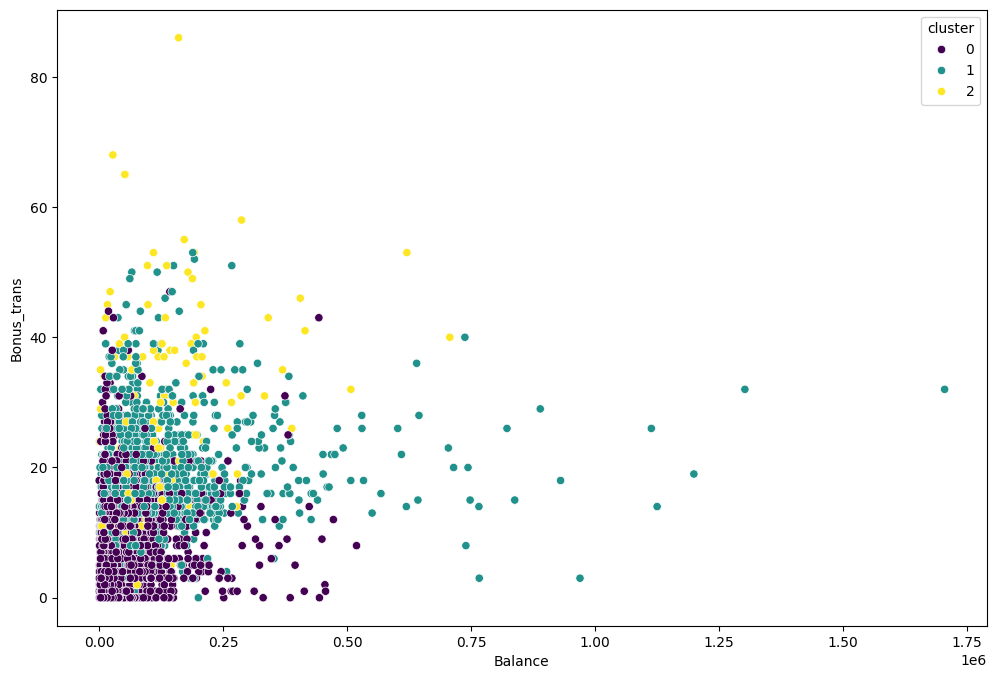

In [30]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Bonus_trans',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Balance', ylabel='Qual_miles'>

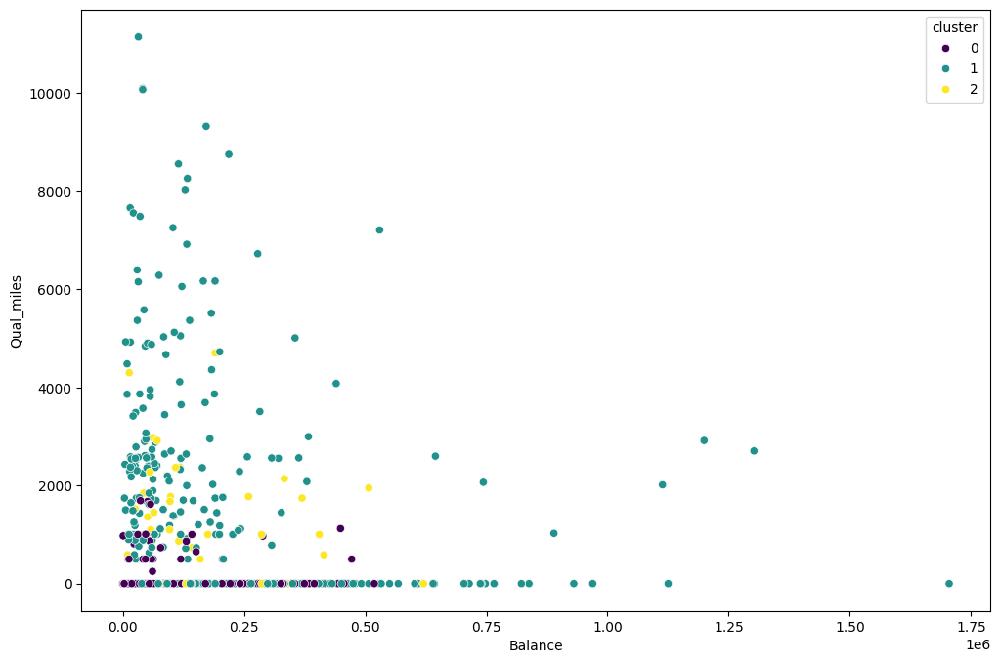

In [31]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Qual_miles',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Balance', ylabel='Flight_miles_12mo'>

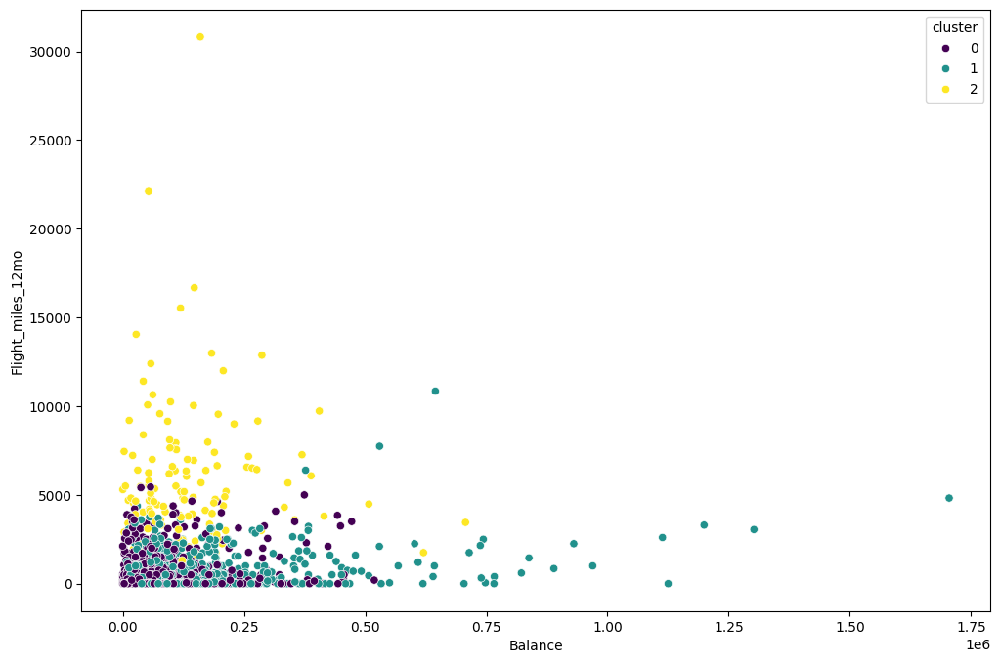

In [32]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Flight_miles_12mo',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Balance', ylabel='Flight_trans_12'>

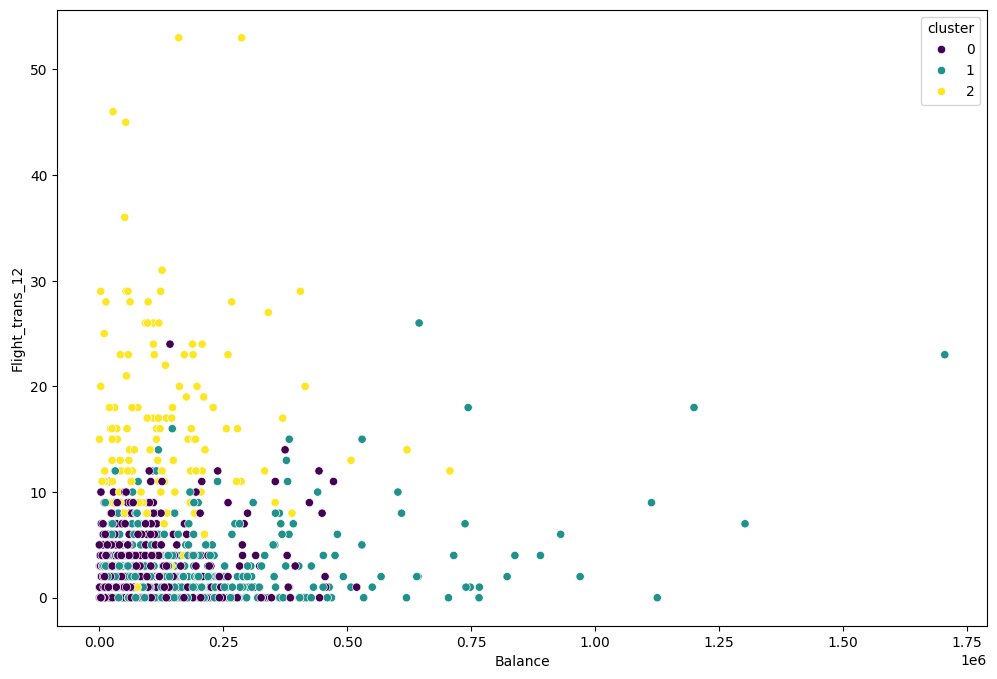

In [33]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Flight_trans_12',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Balance', ylabel='Days_since_enroll'>

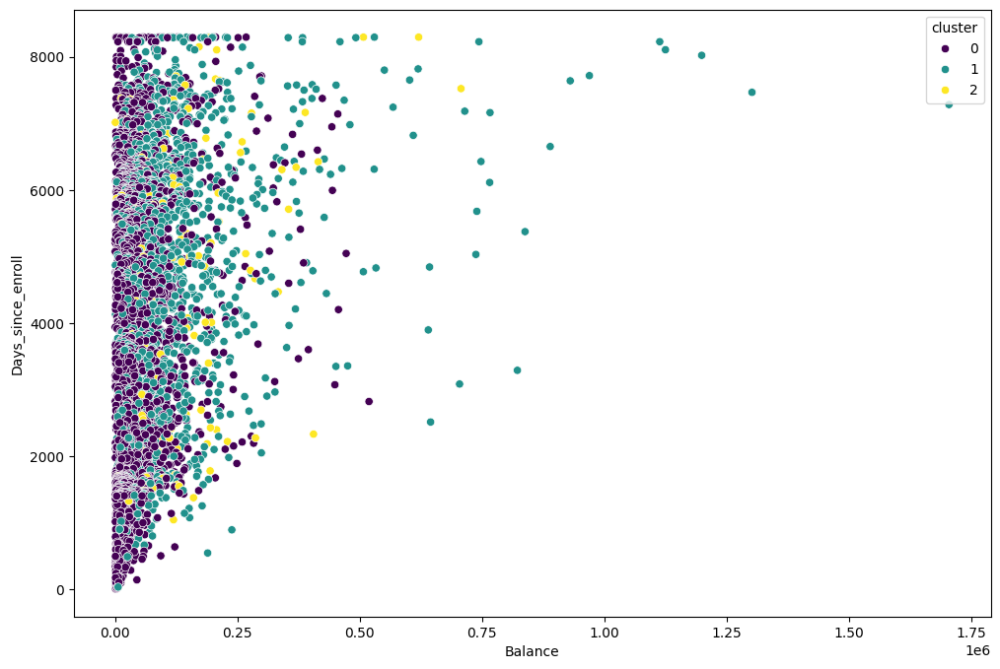

In [35]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Days_since_enroll',data=df, hue='cluster', palette='viridis')

In [49]:
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
ID#,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


<Axes: xlabel='Qual_miles', ylabel='Bonus_miles'>

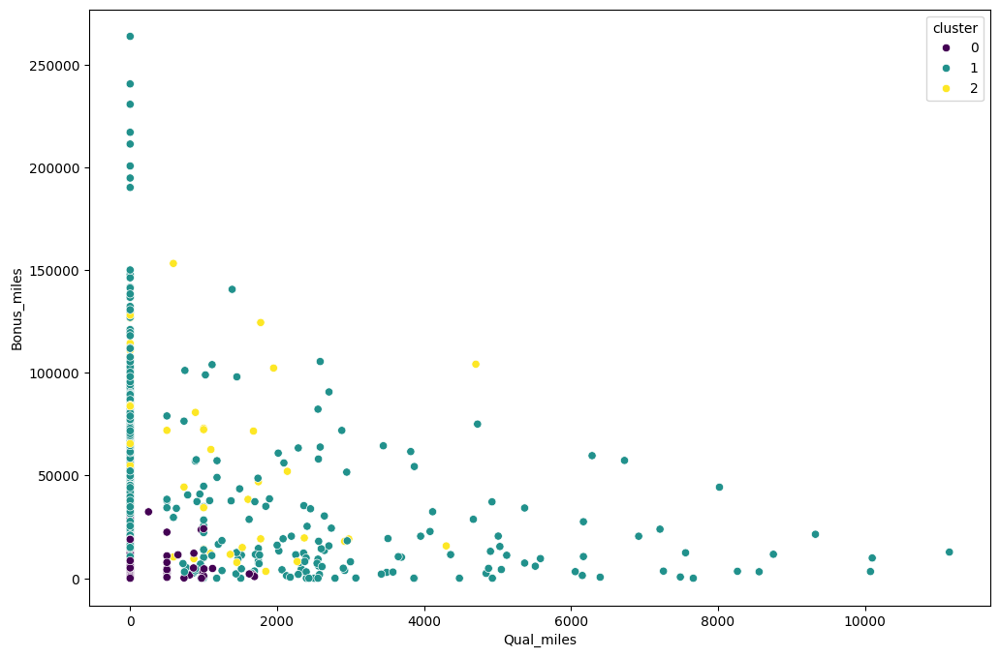

In [45]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Qual_miles',y='Bonus_miles',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Qual_miles', ylabel='Bonus_trans'>

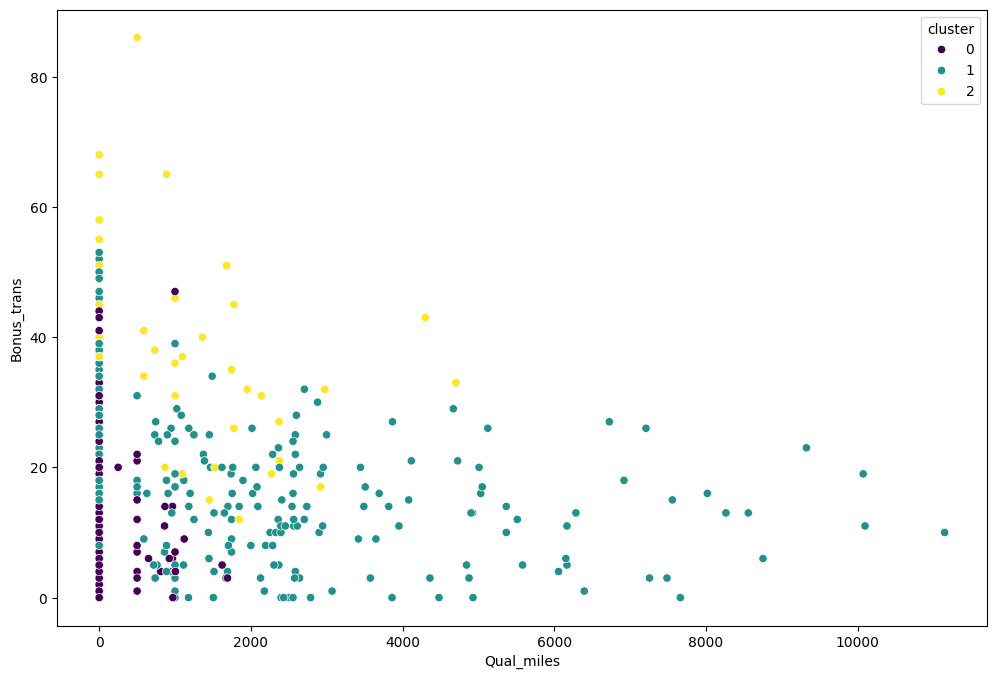

In [46]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Qual_miles',y='Bonus_trans',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Qual_miles', ylabel='Flight_miles_12mo'>

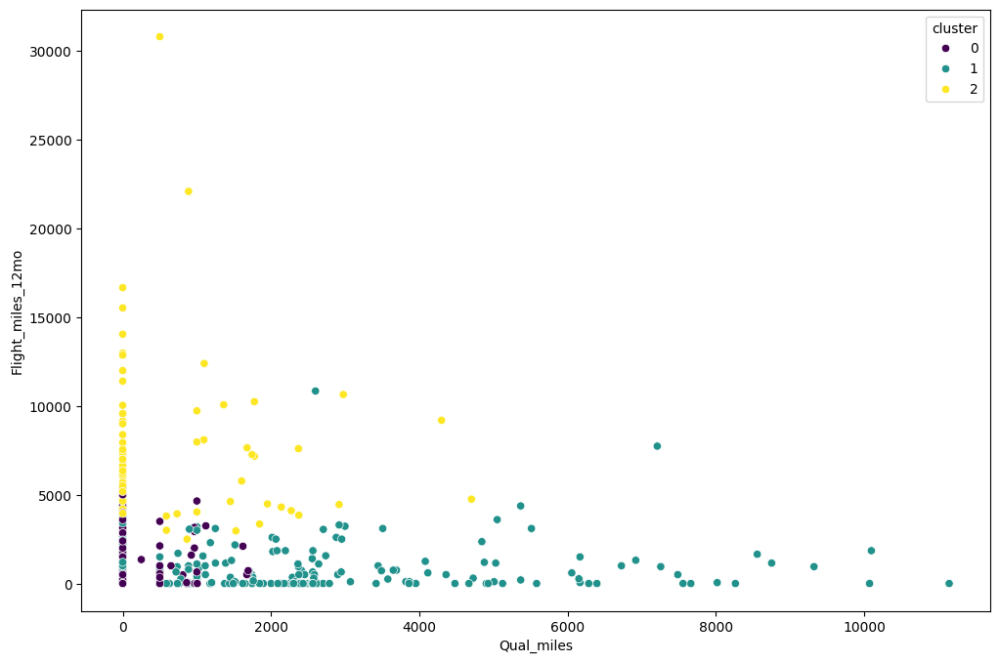

In [48]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Qual_miles',y='Flight_miles_12mo',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Qual_miles', ylabel='Flight_trans_12'>

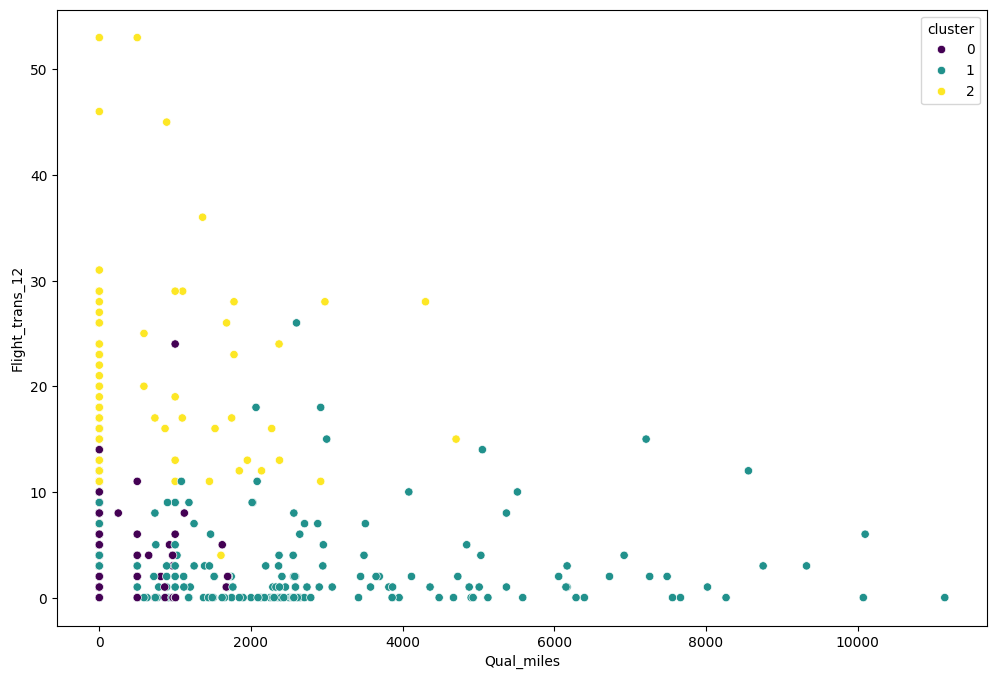

In [51]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Qual_miles',y='Flight_trans_12',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Qual_miles', ylabel='Days_since_enroll'>

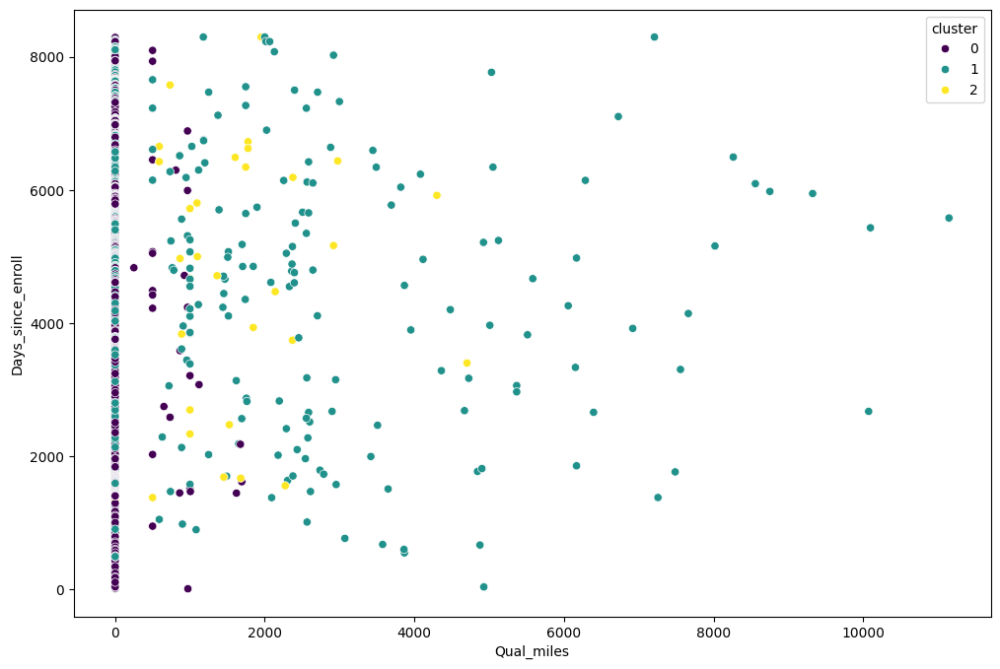

In [52]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Qual_miles',y='Days_since_enroll',data=df, hue='cluster', palette='viridis')

<Axes: xlabel='Award?', ylabel='count'>

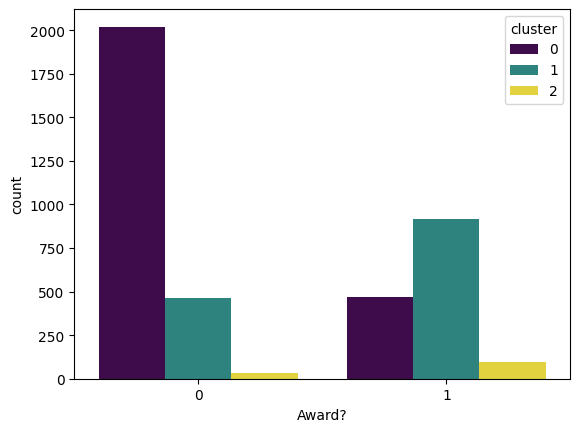

In [54]:
sns.countplot(x = 'Award?', data = df, hue='cluster', palette = 'viridis')

<Axes: xlabel='cc1_miles', ylabel='count'>

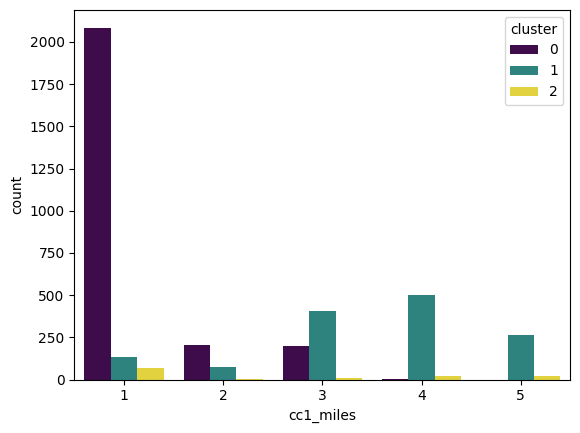

In [56]:
sns.countplot(x = 'cc1_miles', data = df, hue='cluster', palette = 'viridis')

<Axes: xlabel='cc2_miles', ylabel='count'>

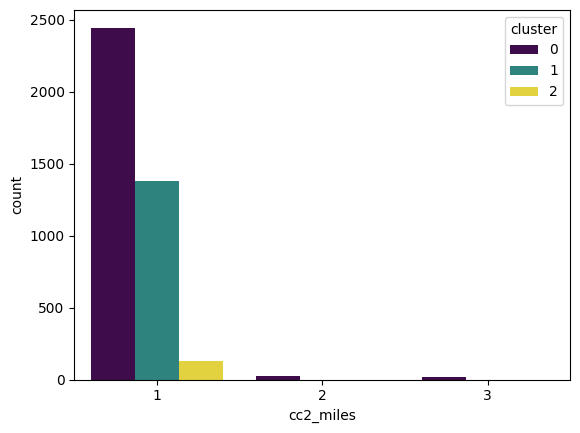

In [57]:
sns.countplot(x = 'cc2_miles', data = df, hue='cluster', palette = 'viridis')

<Axes: xlabel='cc3_miles', ylabel='count'>

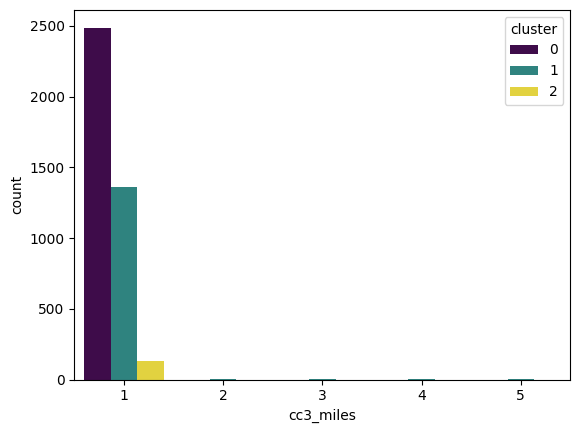

In [58]:
sns.countplot(x = 'cc3_miles', data = df, hue='cluster', palette = 'viridis')

## What can we infer:
- Majority of the data points are belonging to cluster 1 (label 0). And least no. of data points are belonging to cluster 3.
- Cluster 1 has less data points with persons not having Award flight, whereas Cluster 2 has more data points with persons having Award flights.
- Cluster 3 consists of data points with passengers having largest FLight Miels in the past 12 months.

# K-Means clustering

In [73]:
df = pd.read_excel('EastWestAirlines.xlsx',sheet_name='data', index_col='ID#')
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


In [74]:
# Drop record 3393 as its a duplicate
df.drop(index=3393, inplace=True)
df.duplicated().sum()

0

In [75]:
# Model Building
from sklearn.cluster import KMeans

km = KMeans()
km.fit_predict(x)    # Use the scaled data set x

C:\Users\Administrator\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([1, 1, 1, ..., 3, 5, 5])

In [76]:
# Cluster centers
km.cluster_centers_

array([[ 6.42523053e-01, -1.06475181e-01,  1.55323215e+00,
        -9.82542913e-02, -5.03124564e-02,  1.36697233e+00,
         8.69751353e-01, -5.13750364e-02, -5.14366422e-02,
         4.05100772e-01,  5.35322343e-01],
       [-1.45863769e-01, -1.44009126e-01, -4.15886981e-01,
        -9.82542913e-02, -5.75212462e-02, -4.56151826e-01,
        -3.38034660e-01, -2.03649660e-01, -2.22694875e-01,
         7.35659991e-01, -7.67071631e-01],
       [ 6.39500591e-01, -8.44693245e-02,  1.02183982e+00,
        -9.82542913e-02,  1.56443349e+01,  3.17931660e+00,
         1.71441020e+00,  3.32067952e-02,  5.95983297e-02,
         2.39581899e-01,  3.37318153e-01],
       [-1.53322142e-01, -5.84059557e-02, -2.64899456e-01,
        -9.82542913e-02, -6.27744600e-02, -2.71832894e-01,
        -1.03873056e-01, -2.75371542e-02, -2.07943445e-02,
         6.55835577e-02,  1.30365921e+00],
       [ 1.24437893e+00,  4.86092753e-01,  2.36390118e-01,
        -9.82542913e-02, -6.27744600e-02,  8.04703542e-01,
  

In [77]:
# Add the clusters to the data set
df['kmcluster'] = km.fit_predict(x)

C:\Users\Administrator\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [78]:
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,kmcluster
ID#,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


# Elbow graph for finding the ideal no of clusters

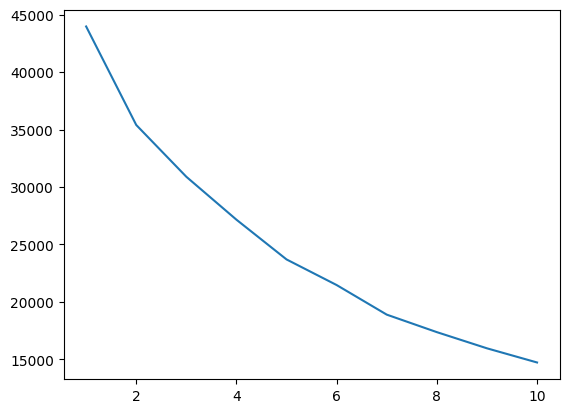

In [116]:
# Find all WCSS values for say k=1 to k=10

wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

plt.plot(range(1,11),wcss)

There are no drastic changes in wcss after k=7, therefore choose k=7 when model building

In [117]:
km = KMeans(n_clusters=7)
ypred = km.fit_predict(x)
ypred

array([2, 2, 2, ..., 6, 1, 1])

In [122]:
# Add the cluster data to the data frame
df['kmcluster'] = ypred

# Visualize the clusters of KMeans

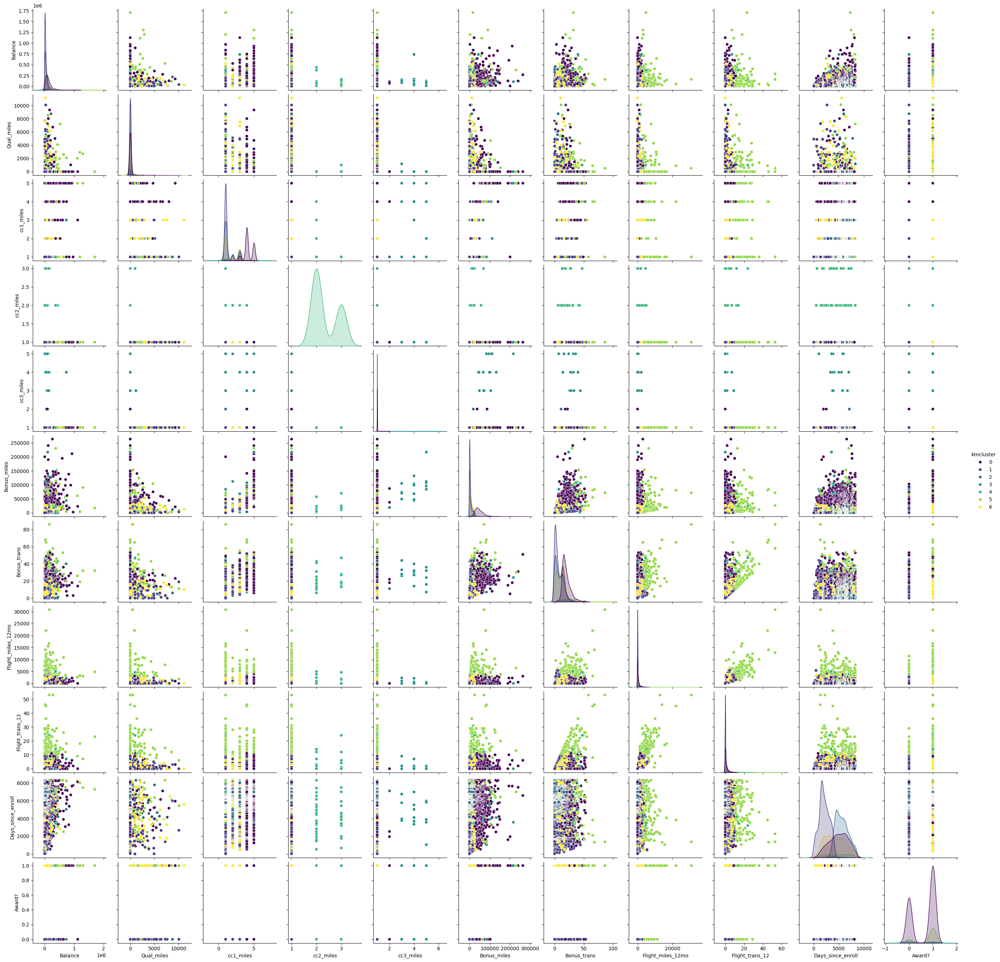

In [123]:
sns.pairplot(df, palette='viridis', hue='kmcluster')

<Axes: xlabel='Balance', ylabel='Qual_miles'>

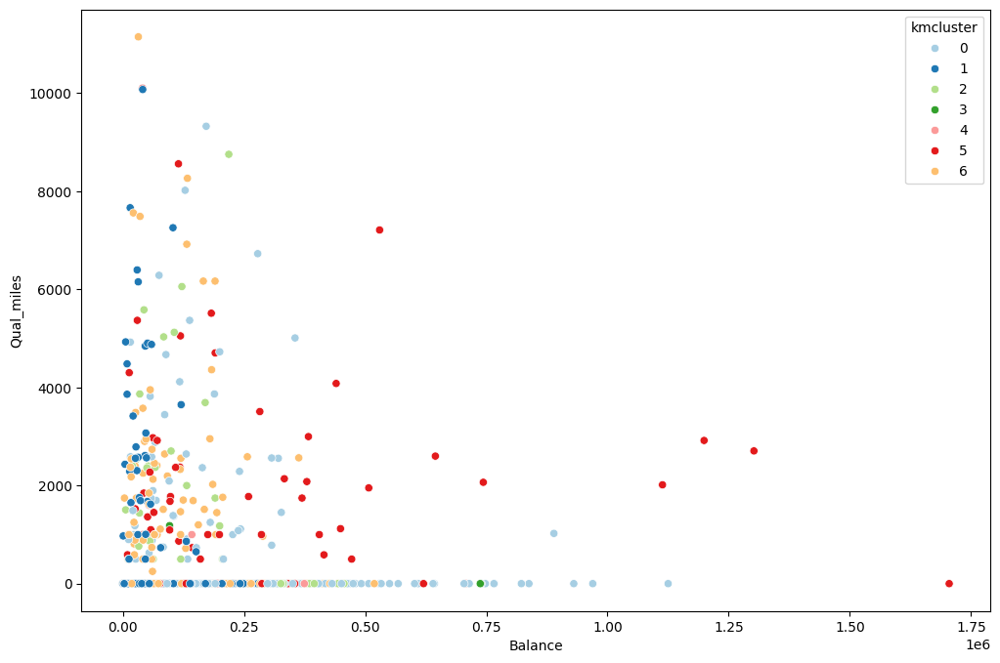

In [124]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Qual_miles',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Bonus_miles'>

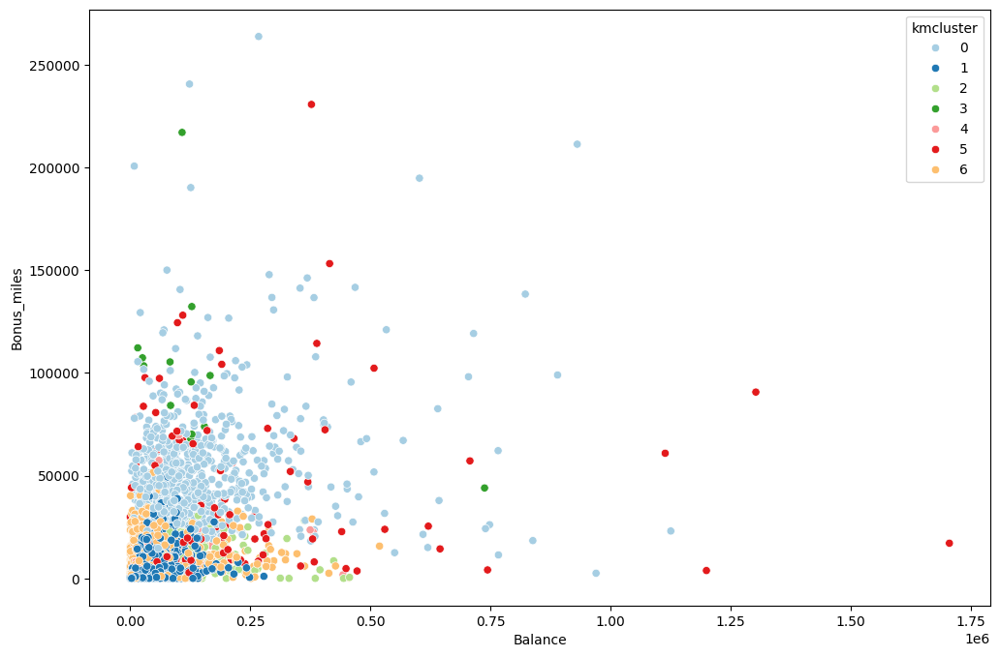

In [125]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Bonus_miles',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Bonus_trans'>

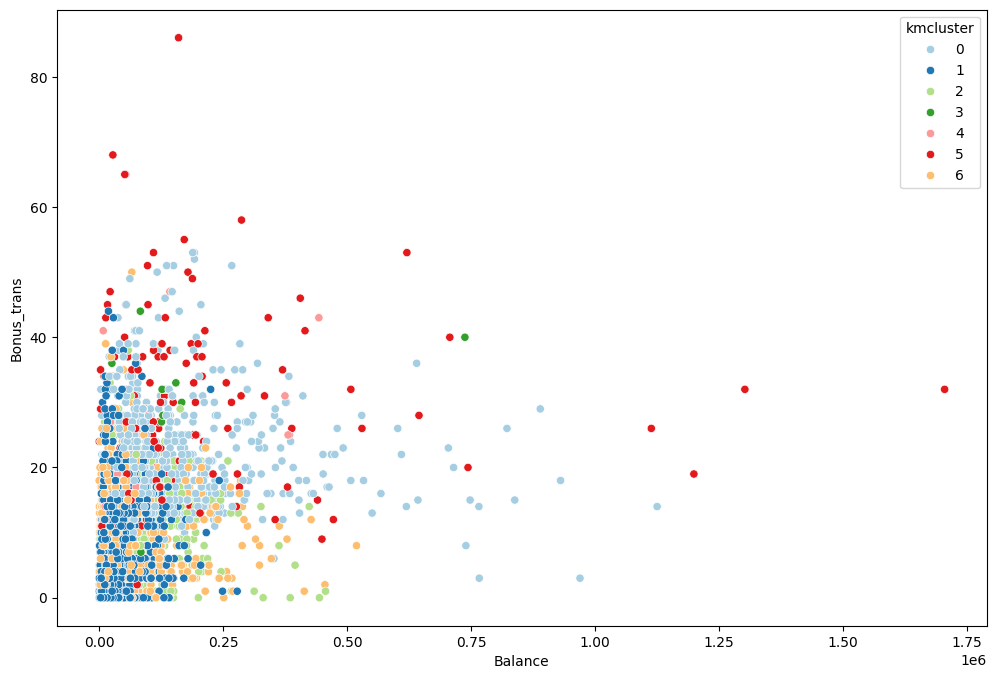

In [126]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Bonus_trans',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Flight_miles_12mo'>

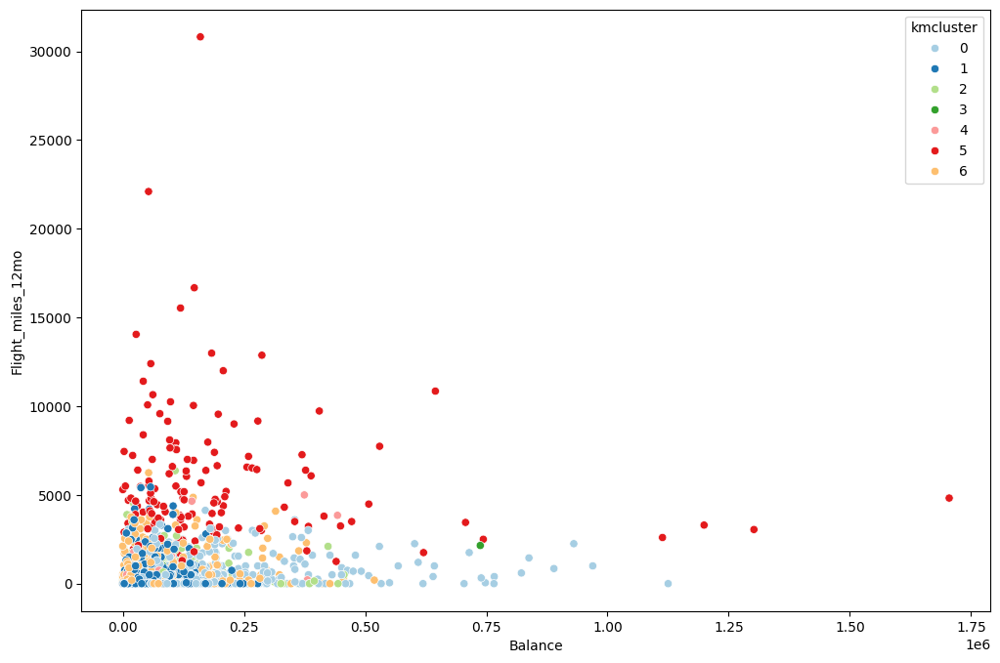

In [127]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Flight_miles_12mo',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Flight_trans_12'>

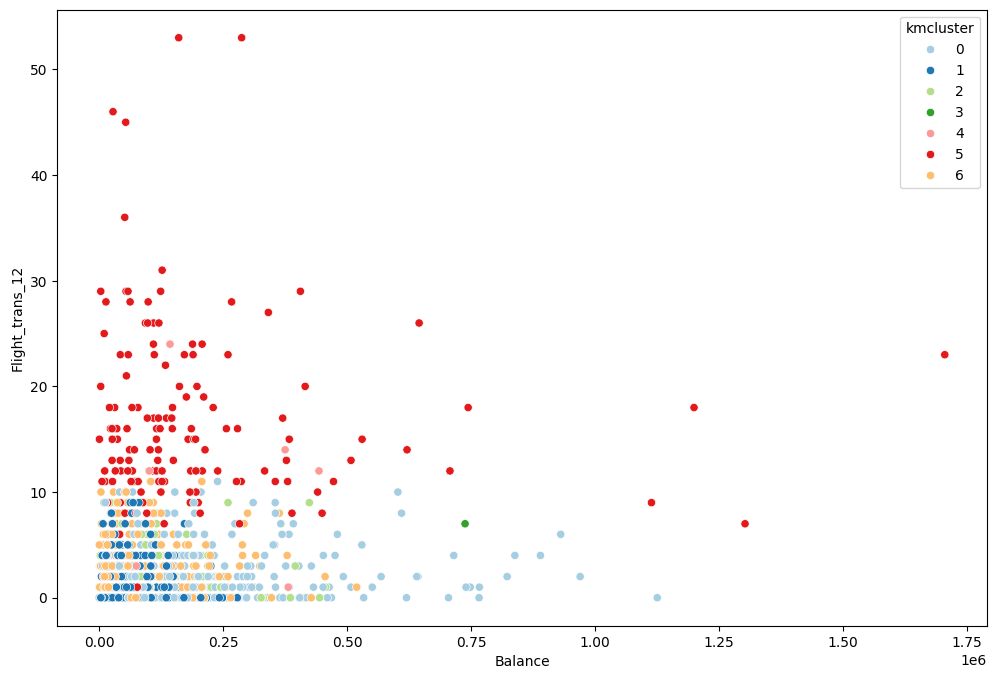

In [128]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Flight_trans_12',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Days_since_enroll'>

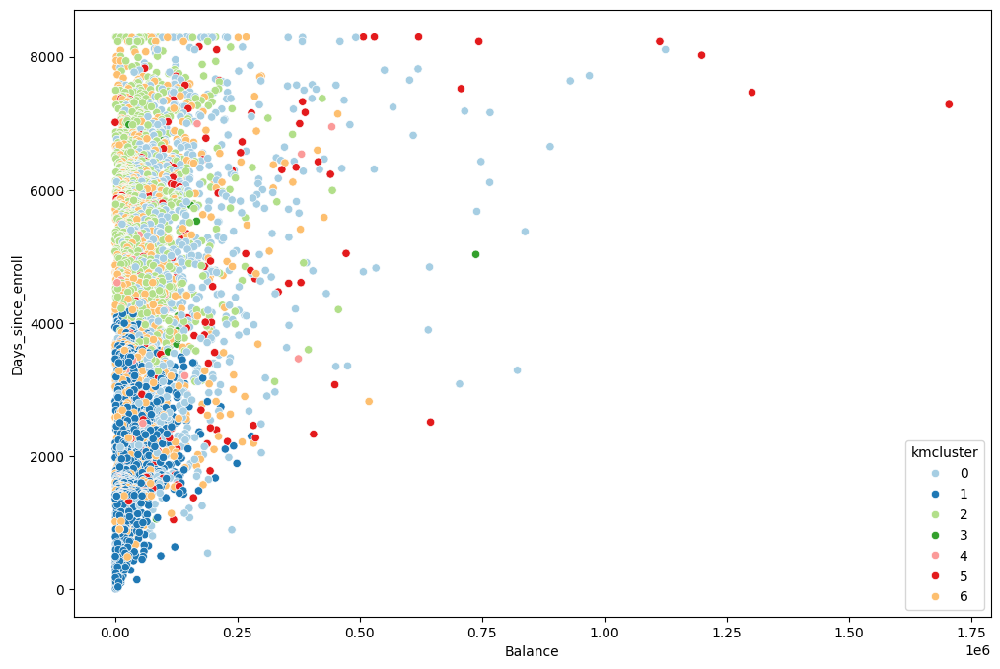

In [129]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Days_since_enroll',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Bonus_miles', ylabel='Qual_miles'>

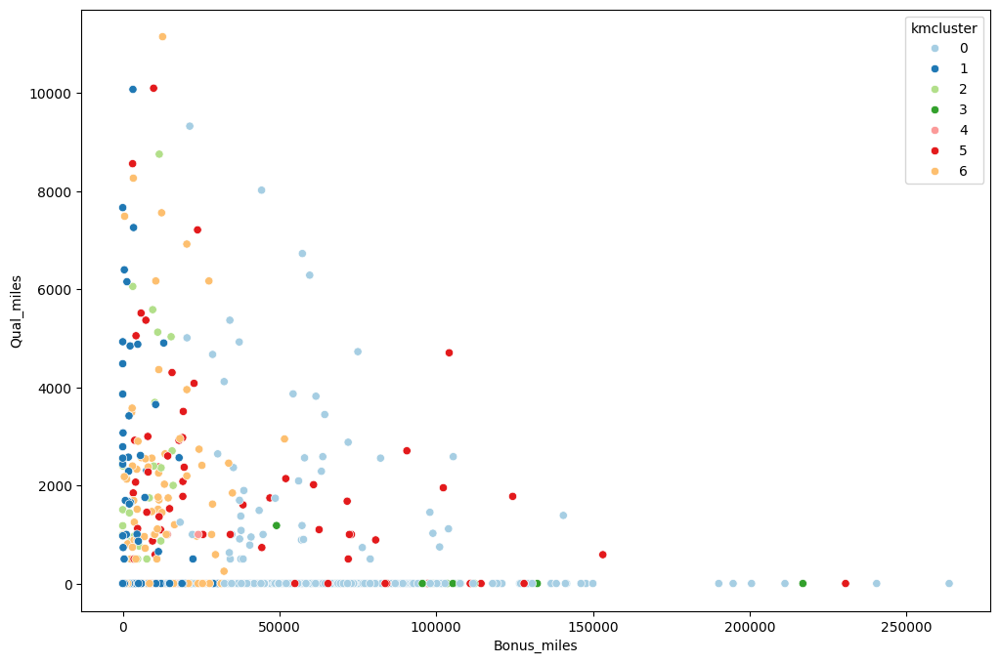

In [130]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Qual_miles',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Bonus_miles', ylabel='Bonus_trans'>

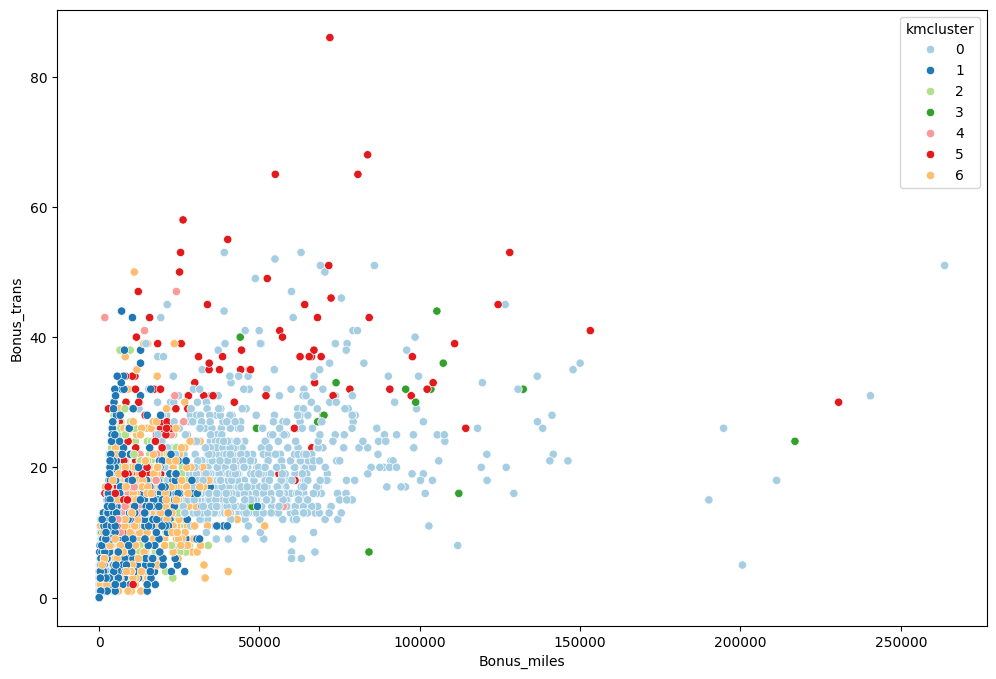

In [131]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Bonus_trans',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Bonus_miles', ylabel='Flight_miles_12mo'>

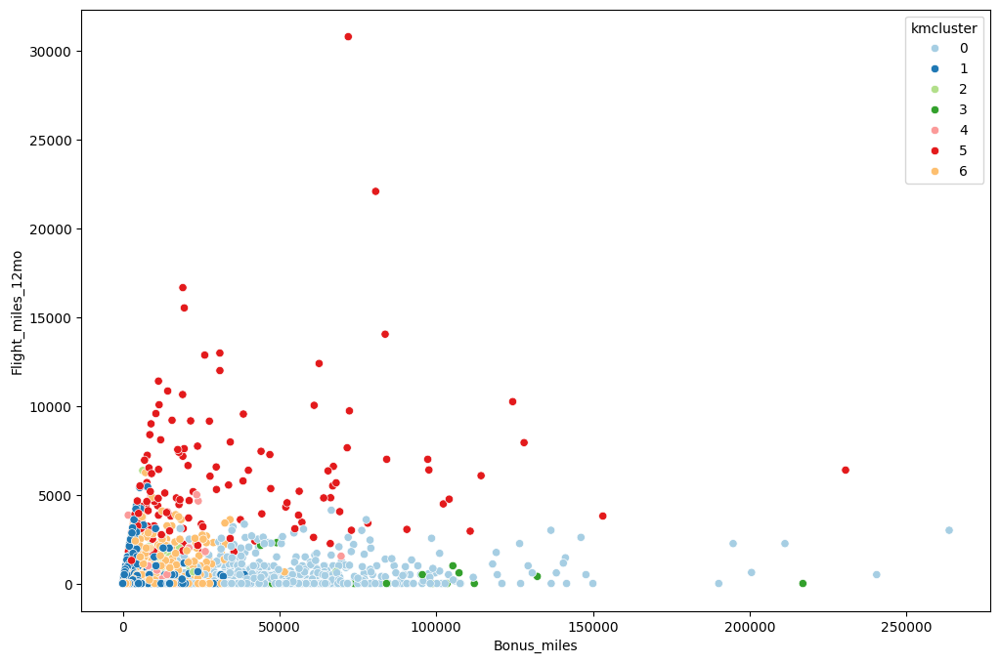

In [132]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Flight_miles_12mo',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Bonus_miles', ylabel='Flight_trans_12'>

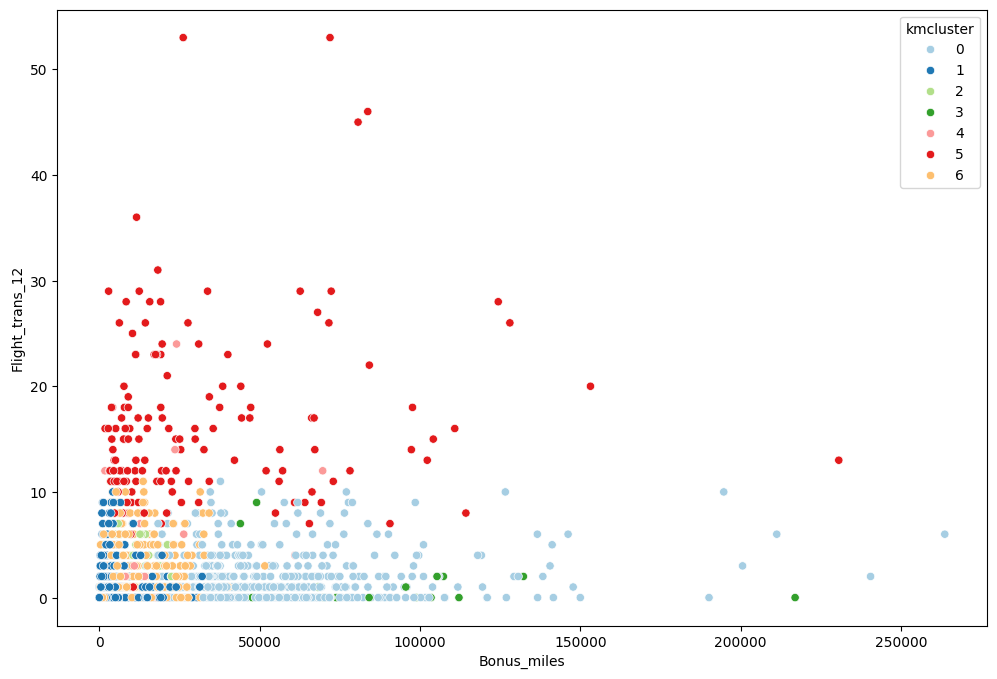

In [133]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Flight_trans_12',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='Bonus_miles', ylabel='Days_since_enroll'>

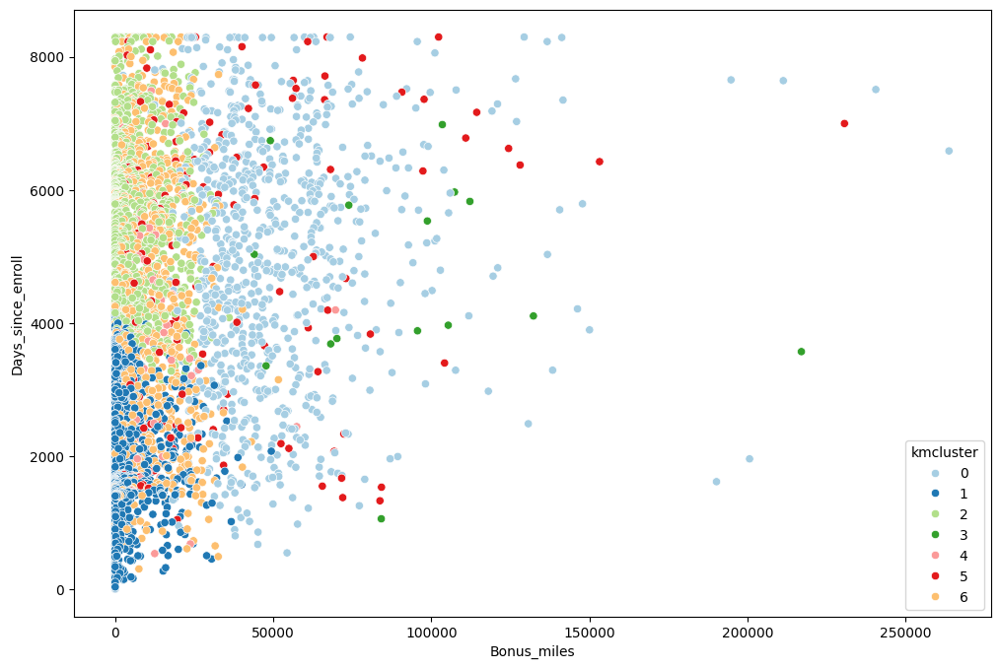

In [134]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Days_since_enroll',data=df, hue='kmcluster', palette='Paired')

<Axes: xlabel='kmcluster', ylabel='count'>

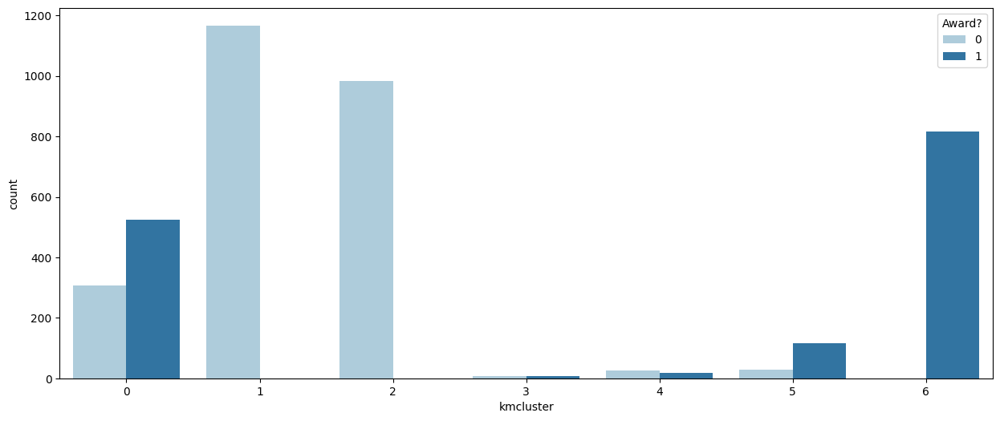

In [135]:
plt.figure(figsize=(15,6))
sns.countplot(x='kmcluster', data=df, hue='Award?',palette='Paired')

<Axes: xlabel='kmcluster', ylabel='count'>

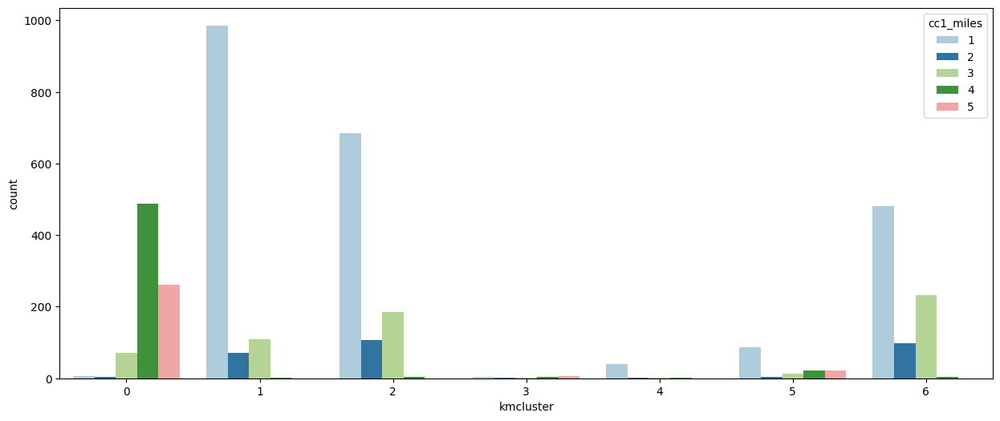

In [136]:
plt.figure(figsize=(15,6))
sns.countplot(x='kmcluster', data=df, hue='cc1_miles',palette='Paired')

<Axes: xlabel='kmcluster', ylabel='count'>

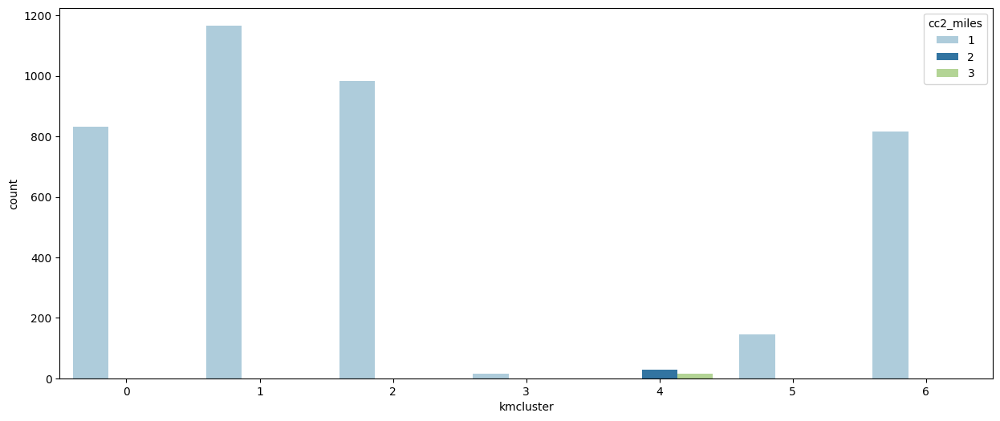

In [137]:
plt.figure(figsize=(15,6))
sns.countplot(x='kmcluster', data=df, hue='cc2_miles',palette='Paired')

<Axes: xlabel='kmcluster', ylabel='count'>

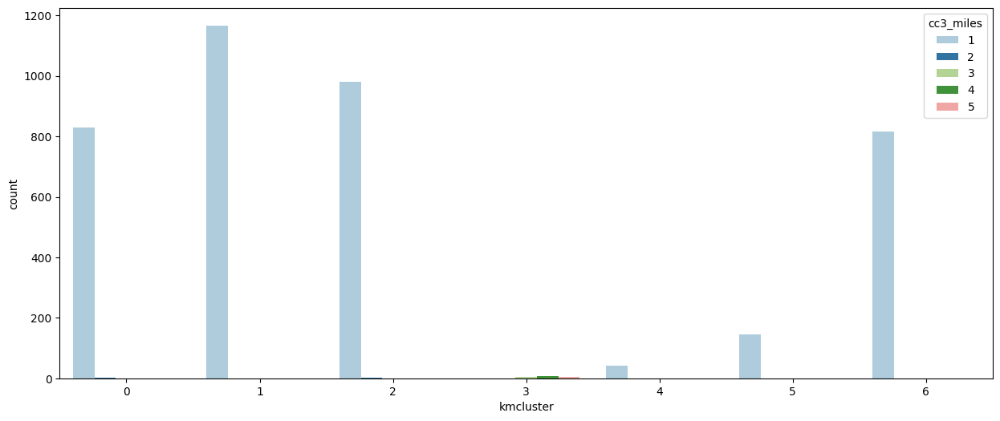

In [138]:
plt.figure(figsize=(15,6))
sns.countplot(x='kmcluster', data=df, hue='cc3_miles',palette='Paired')

# Evaluation of KMeans using Silhouette score

In [139]:
from sklearn.metrics import silhouette_score as sl

In [140]:
# Calculate the Silhouette score 

sl(x,ypred)

0.22408153612254142

This values suggests that there are overlapping and/or outliers present in the data set.

In [141]:
df.groupby('kmcluster').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
kmcluster,,,,,,,,,,,
0,138609.876053,145.703971,4.200963,1.000000,1.002407,50222.468111,19.944645,381.979543,1.160048,4953.649819,0.630566
1,34593.161954,94.526992,1.251071,1.000000,1.000000,4393.730934,6.596401,142.600686,0.426735,2091.568123,0.000000
2,59850.373727,71.308554,1.498982,1.000000,1.001018,6282.930754,8.472505,176.524440,0.523422,5633.392057,0.000000
3,138061.400000,78.800000,3.466667,1.000000,4.066667,93927.866667,28.066667,506.666667,1.600000,4613.866667,0.533333
4,68876.581395,23.255814,1.139535,2.348837,1.000000,14689.837209,17.534884,582.627907,2.209302,3968.930233,0.395349
5,190789.434483,831.213793,2.227586,1.000000,1.000000,33087.993103,28.041379,5675.020690,16.620690,4693.062069,0.806897
6,58043.598773,186.733742,1.703067,1.000000,1.000000,10664.671166,10.506748,401.282209,1.212270,4243.953374,1.000000


<Axes: xlabel='kmcluster', ylabel='count'>

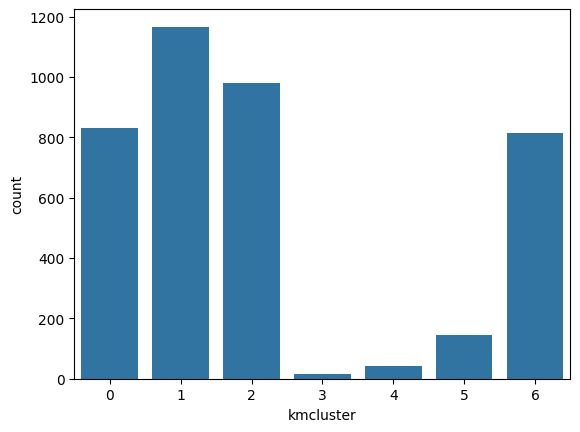

In [144]:
# Bar plot of count of data points in each cluster
sns.countplot(x='kmcluster',data=df)

### What can we infer:
- The silhouette score is 0.22, which indicates a good clustering, but there are outliers and overlapping present within the clusters or data set.
- Maximum data points are classified as cluster 1, followed by cluster 2, cluster 0 and 6. Whereas the least data points are present in  Cluster 3.
- Cluster 1 data points are having average value of Days since enrolled as 2091.5, Award flights as 0.
- Clusters 0 and 6 contains most of the passengers who are eligible for Award.
- Cluster 3 is made up of passengers who have large average Bonus miles from non-flight transactions and those who have used more than 25000 with small Business credit cards on an average (cc3_miles = 4.067, 4 denotes expense range of 25000-50000)
- Cluster 5 is made up of passengers having High average Balance miles eligible for award of 190790 miles and very high Qualifying miles for Topflight status
- Cluster 2 and 4 are seemingly similar except when considering Average Bonus miles, Flight miles which contribute more towards Cluster 4, though Cluster 4 has much less data points.

# DBSCAN Clustering

In [147]:
# Use df variable and drop 'kmcluster' column
df.drop(columns='kmcluster',inplace=True)
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


In [149]:
from sklearn.cluster import DBSCAN

In [150]:
# Create a new model

db = DBSCAN(eps=0.5, min_samples=3)

ypred = db.fit_predict(x)

In [151]:
# Calculate the Silhouette score

sl(x,ypred)

-0.11463331205036745

This value indicates bad clustering, which can be improved by hyper parameter tuning. Here the epsilon value is the hyperparameter.

In [152]:
# Import NearestNeighbor library

from sklearn.neighbors import NearestNeighbors

In [153]:
# Fit the scaled data set and create a model

nb = NearestNeighbors(n_neighbors=3).fit(x)

# Obtain the distances and Indices

d, index = nb.kneighbors(x)

In [154]:
d

array([[0.        , 0.11185195, 0.12033566],
       [0.        , 0.11406716, 0.11438169],
       [0.        , 0.16540105, 0.19458411],
       ...,
       [0.        , 0.16614444, 0.28024134],
       [0.        , 0.25725538, 0.27165991],
       [0.        , 0.00270567, 0.01129616]])

In [155]:
# Select only column 1 (2nd column from the above 2D array)
distance = np.sort(d[:,1])
distance

array([2.26429338e-03, 2.26429338e-03, 2.70567023e-03, ...,
       6.61619449e+00, 6.67812374e+00, 7.46068077e+00])

Text(0.5, 1.0, 'K-Distance Graph')

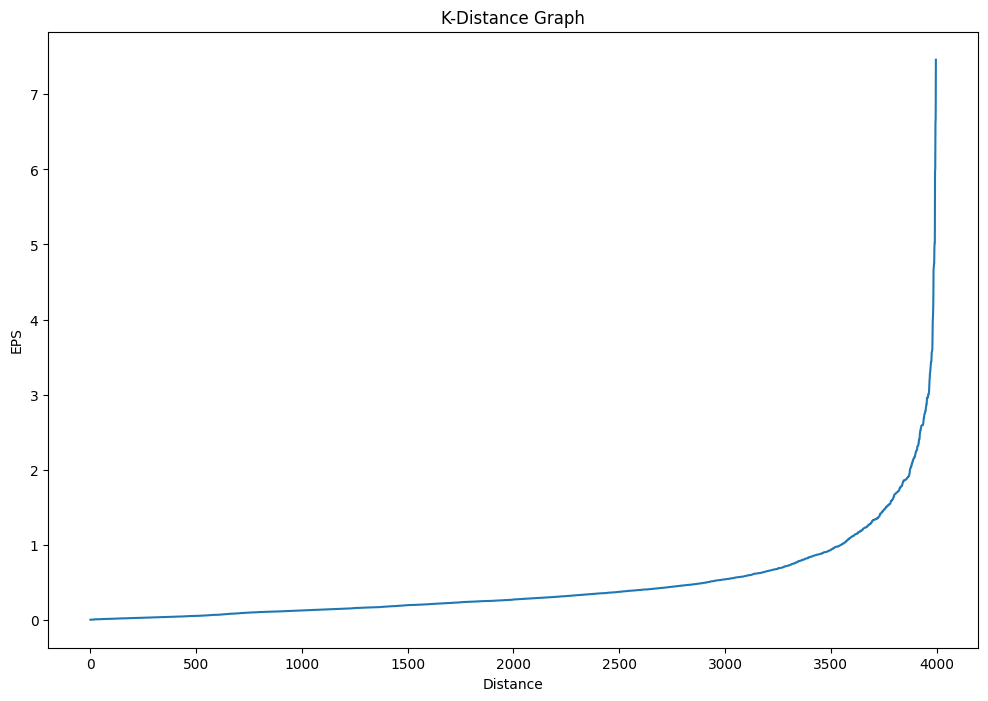

In [157]:
# Plot the distances 
plt.figure(figsize=(12,8))
plt.plot(distance)
plt.xlabel('Distance')
plt.ylabel('EPS')
plt.title('K-Distance Graph')

From the above graph, we can select esp value of 1.5 

In [159]:
# Create a new model with eps=1.5

db = DBSCAN(eps=1.5, min_samples=3)
yp = db.fit_predict(x)
sl(x,yp)

0.21245777724284173

In [160]:
df['dbcluster'] = yp
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,dbcluster
ID#,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


<Axes: xlabel='dbcluster', ylabel='count'>

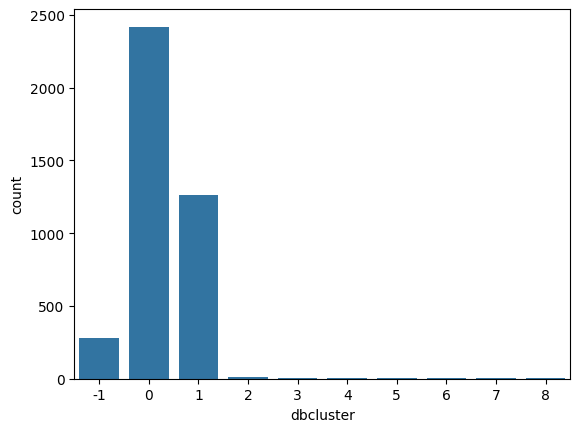

In [161]:
sns.countplot(x='dbcluster',data=df)

Cluster -1 indicates all the outlier data points. In this case we see that there are nearly 250 data points which are outliers.

In [162]:
df.groupby('dbcluster').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
dbcluster,,,,,,,,,,,
-1,224379.826715,1351.657040,2.797834,1.079422,1.176895,47374.974729,25.646209,3154.097473,9.263538,4908.884477,0.768953
0,56752.788756,37.182720,1.687888,1.000000,1.000000,9662.322034,8.783795,176.214965,0.519636,3804.465895,0.000000
1,73227.488095,63.781746,2.634127,1.000000,1.000000,24968.446032,13.792857,403.042063,1.250000,4567.534127,1.000000
2,38556.733333,0.000000,1.000000,2.000000,1.000000,8951.533333,12.933333,60.000000,0.400000,3390.400000,0.000000
3,109387.666667,0.000000,1.000000,1.000000,1.000000,7488.000000,19.333333,6621.333333,18.333333,4882.333333,0.000000
4,36524.250000,0.000000,1.000000,3.000000,1.000000,15518.500000,14.500000,50.000000,0.250000,3179.625000,0.000000
5,31161.600000,0.000000,1.000000,2.000000,1.000000,8723.400000,13.800000,350.000000,1.000000,3314.800000,1.000000
6,289683.333333,2468.666667,4.333333,1.000000,1.000000,67882.666667,21.666667,333.333333,1.000000,4521.000000,1.000000
7,56856.250000,6047.250000,1.000000,1.000000,1.000000,3648.500000,4.000000,216.750000,0.750000,3726.500000,0.000000


<Axes: xlabel='Bonus_miles', ylabel='Days_since_enroll'>

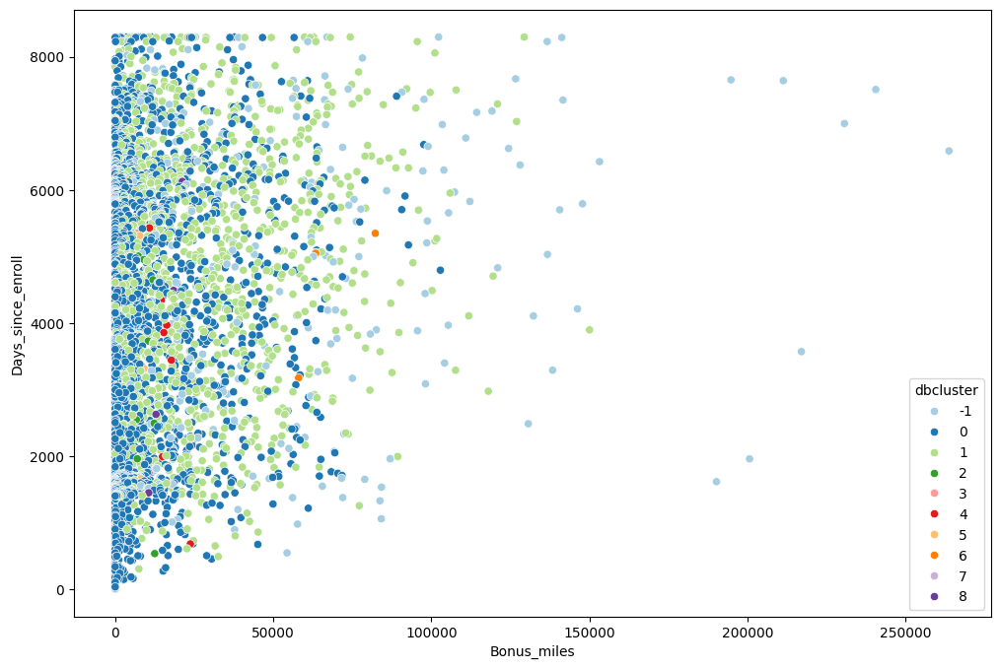

In [163]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Days_since_enroll',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='Bonus_miles', ylabel='Qual_miles'>

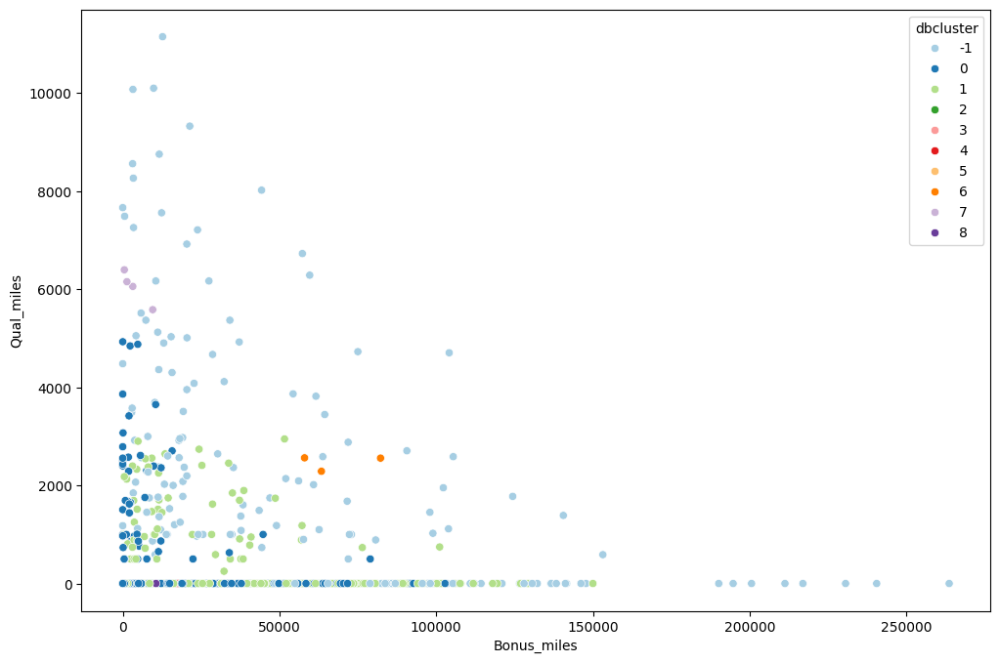

In [164]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Bonus_miles',y='Qual_miles',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Bonus_miles'>

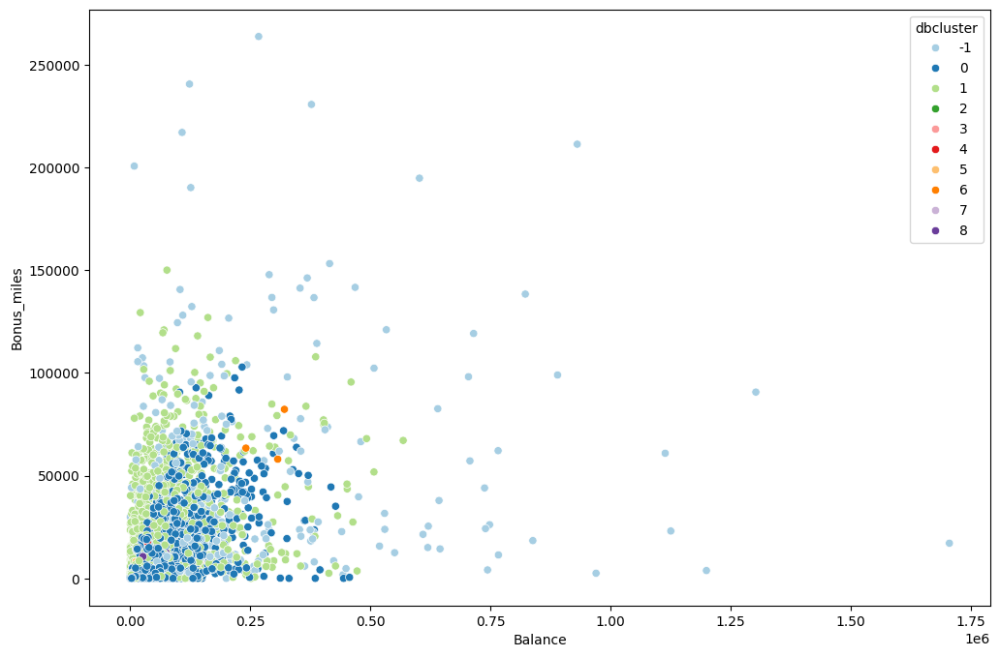

In [166]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Bonus_miles',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Bonus_trans'>

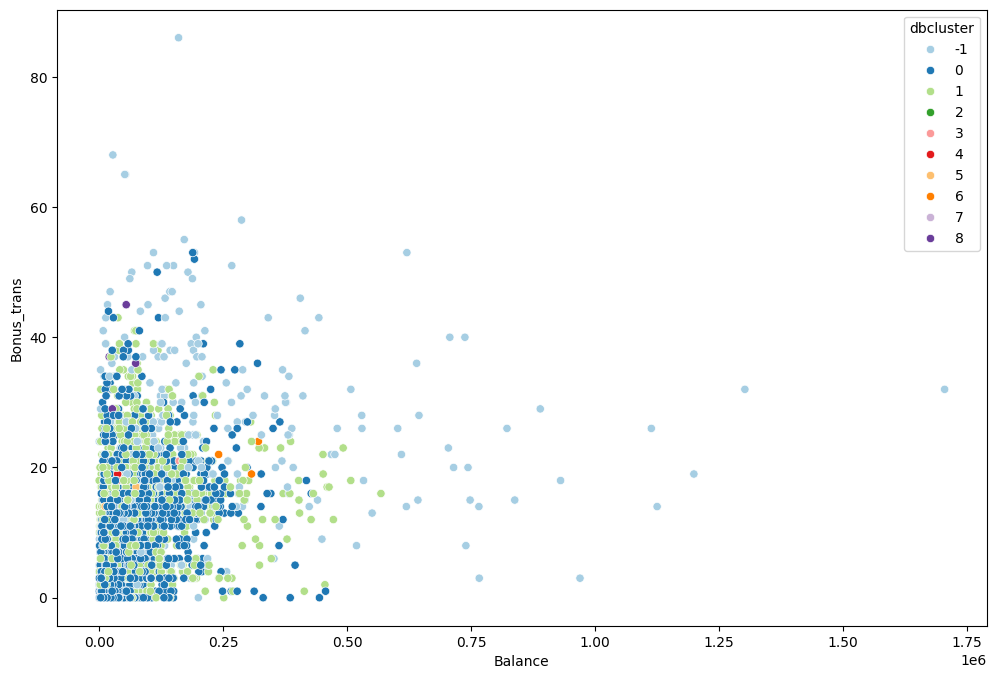

In [167]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Bonus_trans',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Flight_miles_12mo'>

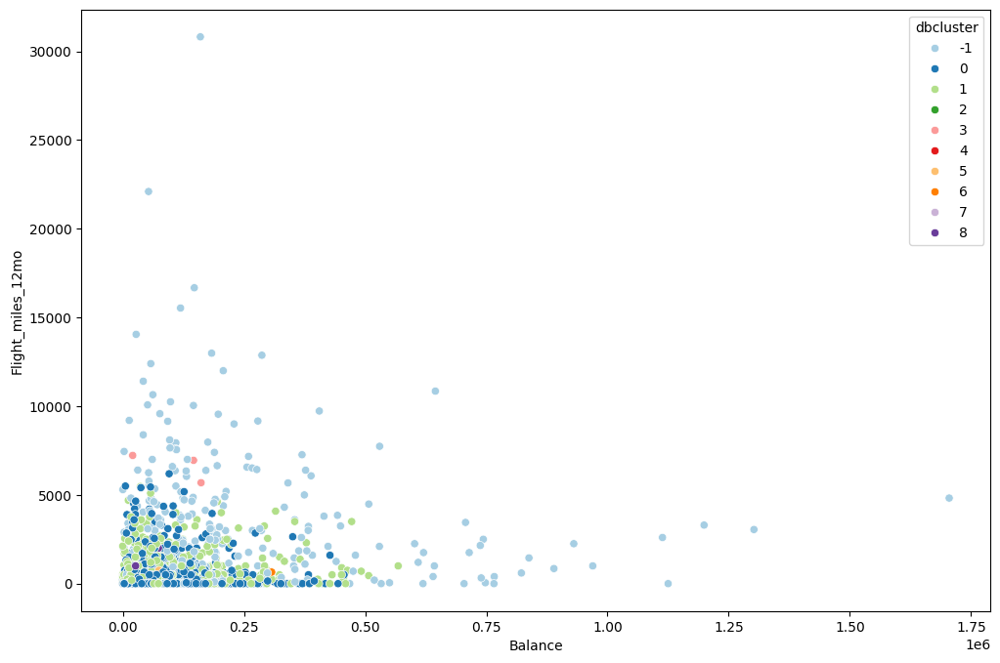

In [168]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Flight_miles_12mo',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Flight_trans_12'>

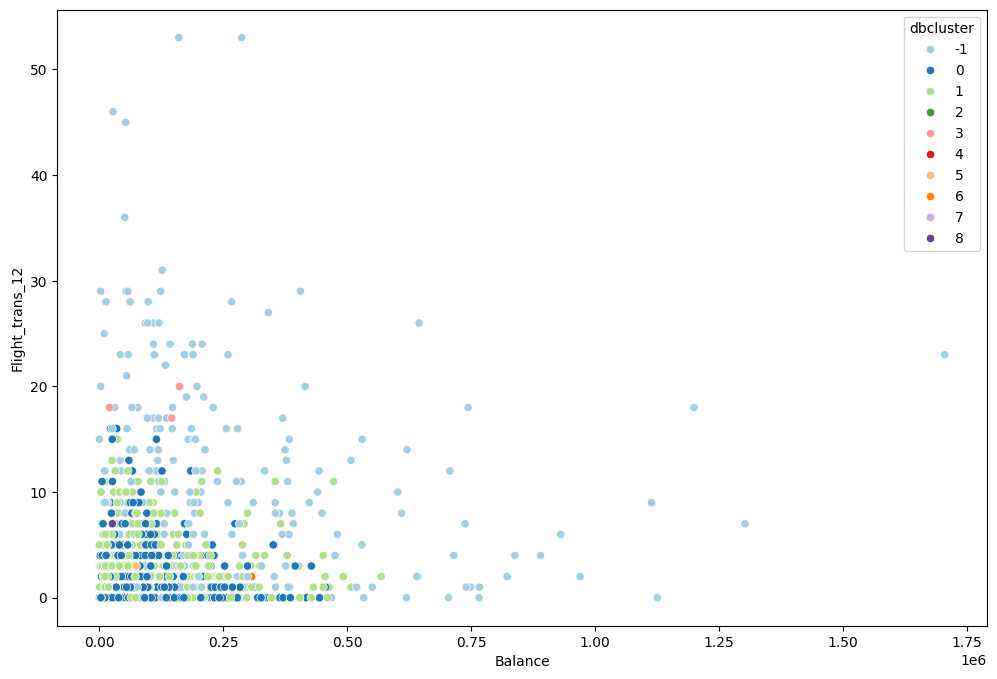

In [169]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Flight_trans_12',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='Balance', ylabel='Days_since_enroll'>

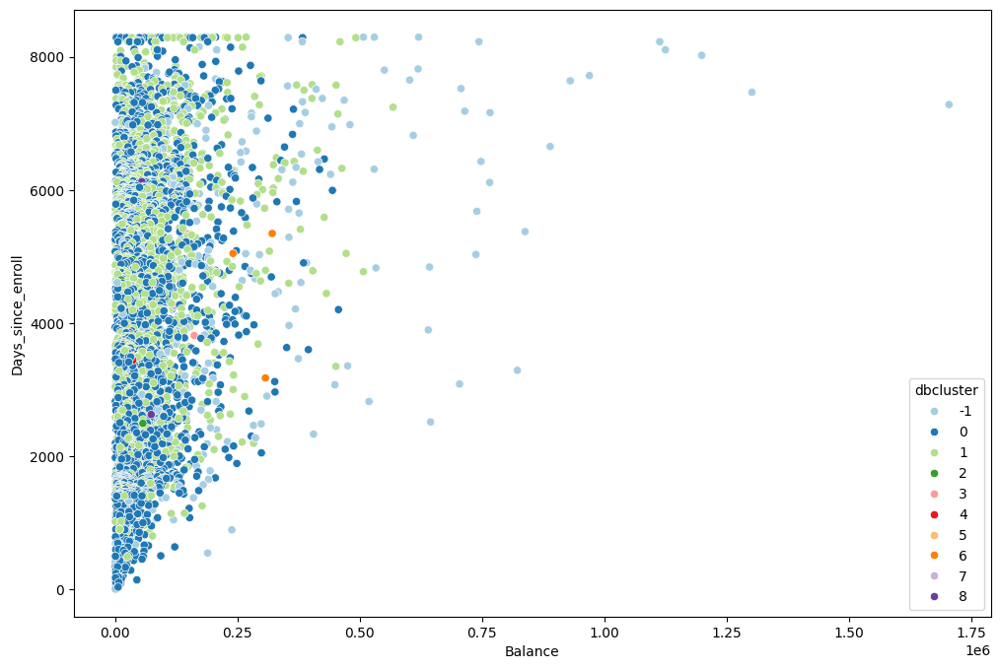

In [170]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Balance',y='Days_since_enroll',data=df, hue='dbcluster', palette='Paired')

<Axes: xlabel='dbcluster', ylabel='count'>

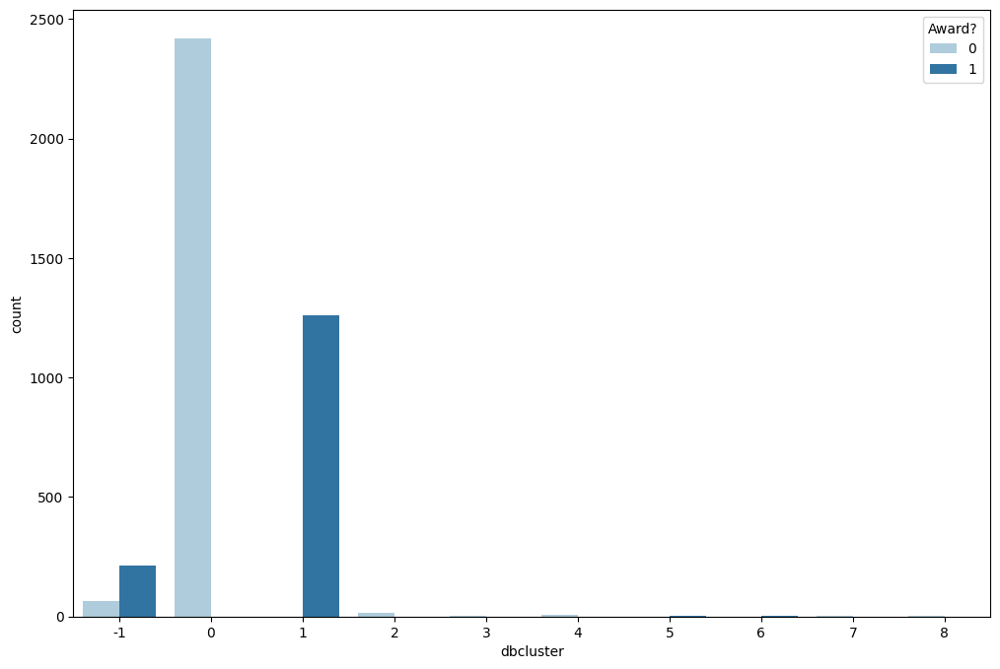

In [172]:
plt.figure(figsize=(12,8))
sns.countplot(x='dbcluster',data=df,hue='Award?', palette='Paired')

<Axes: xlabel='dbcluster', ylabel='count'>

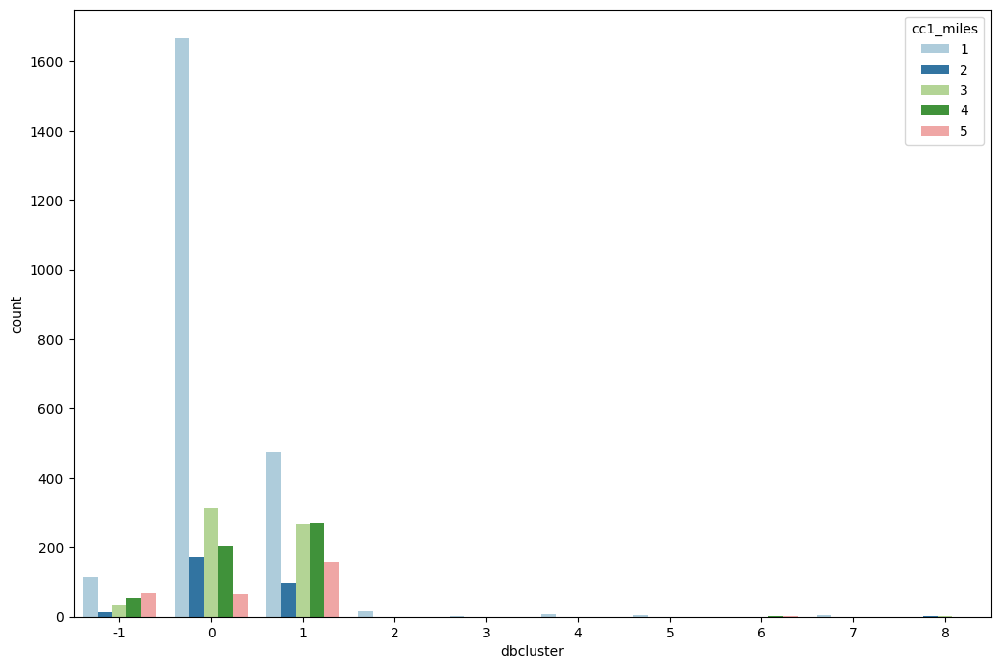

In [173]:
plt.figure(figsize=(12,8))
sns.countplot(x='dbcluster',data=df,hue='cc1_miles', palette='Paired')

<Axes: xlabel='dbcluster', ylabel='count'>

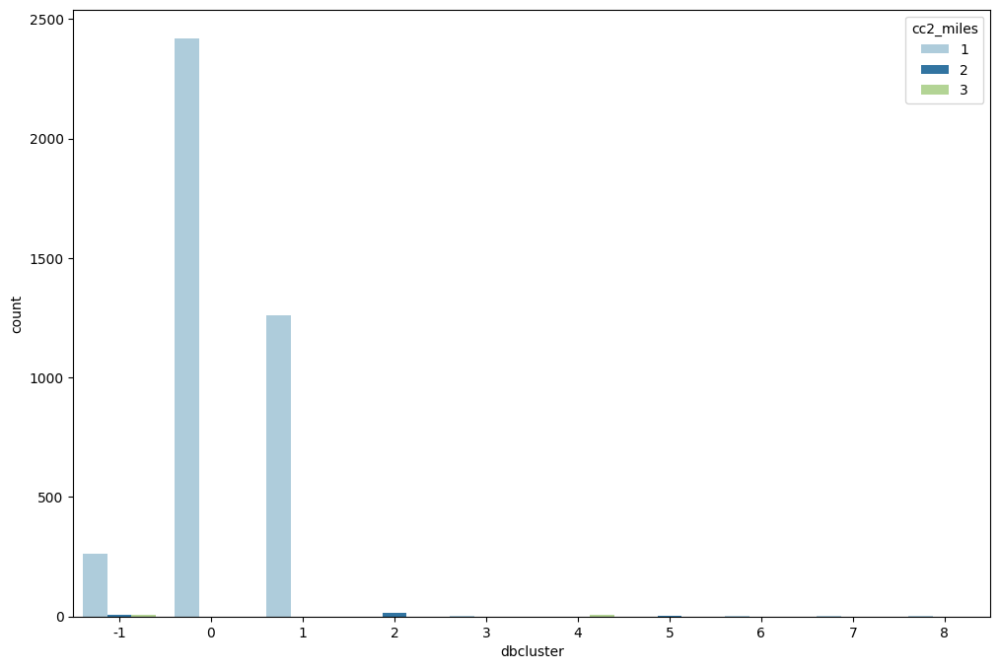

In [174]:
plt.figure(figsize=(12,8))
sns.countplot(x='dbcluster',data=df,hue='cc2_miles', palette='Paired')

<Axes: xlabel='dbcluster', ylabel='count'>

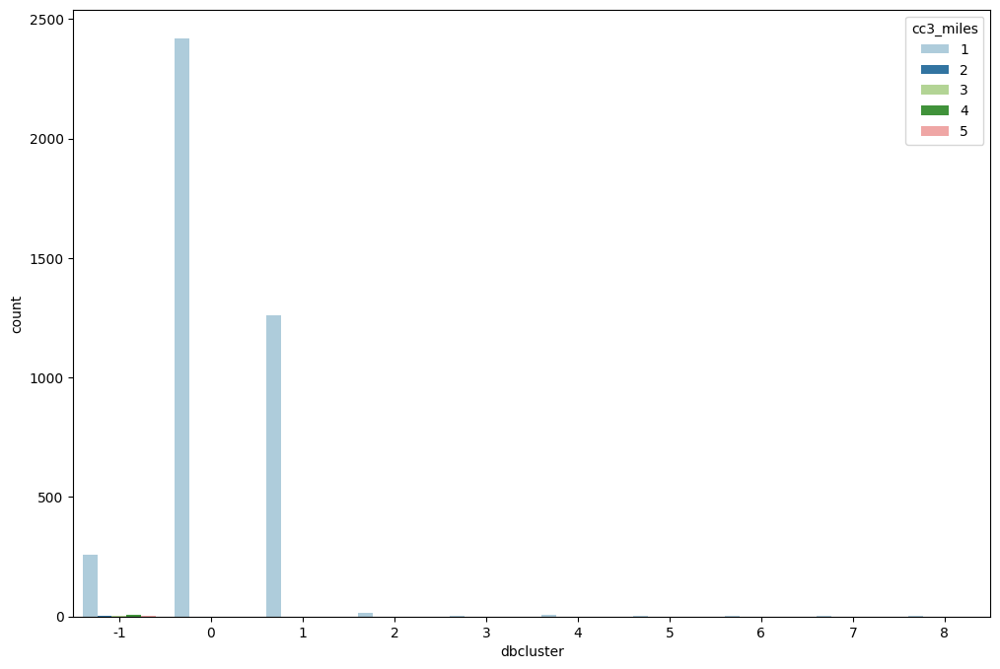

In [175]:
plt.figure(figsize=(12,8))
sns.countplot(x='dbcluster',data=df,hue='cc3_miles', palette='Paired')

## What can we infer:
- We obtained a Silhouette score of 0.2124, which indicates a good clustering and presence of outliers.
- Cluster -1 is made up of outlier data points.
- Cluster 0 is the largest cluster having nearly 2400 data points.
- Clusters from 2 to 8 have very less data points (<=15).